# ZENODO PROCESSING

In [132]:
pd.read_csv('.csv')

,location,text,month
0,India,India's purchase of discounted #Russian crude ...,2022-04
1,Dubai,#Russia’s President Vladimir #Putin says he ha...,2022-04
2,Canada,Sad to read of the #RussianArmy invading of #C...,2022-04
3,UK,The #Anonymous collective has sent 7.000.000 a...,2022-04
4,USA,Read: https://t.co/kzxUuS6Z4d\n.\n.\n.\n.\n.\n...,2022-04
...,...,...,...
7998869,UK,This is the Belarusian battalion named after K...,2022-03
7998870,USA,IMAGE of a captured Russian ZSU-23 Shilka Anti...,2022-03
7998871,USA,@cbain00 @663Renegade @BeatriceLacy @szentandr...,2022-03
7998872,UK,The biggest advantage for 🇺🇦 now with the 🇷🇺 r...,2022-03


In [129]:
import json
import pandas as pd
from tqdm.notebook import tqdm
import numpy as np

In [130]:
file_path = 'dataset_zenodo.jsonl'

# Читання файла JSONL та збереження даних у список
data = []
with open(file_path, 'r') as file:
    for line in tqdm(file):
        # Кожен рядок у файлі JSONL є окремим валідним JSON
        # Розширенням .jsonl може бути, але не обов'язково
        data.append(json.loads(line.strip()))

# data тепер містить дані з файлу JSONL у вигляді списку об'єктів JSON


FileNotFoundError: [Errno 2] No such file or directory: 'dataset_zenodo.jsonl'

In [22]:
len(data)

1524832

In [36]:
df = pd.DataFrame(index=[i for i in range(len(data))], columns=['tweet_id','text','lang','country','sentiment','This statement is in favour of Russia','This statement is against Russia',\
                          'This statement is against Ukraine','This statement is in favour of Ukraine',\
                          'This statement is in favour of war','This statement is against war',\
                          'This statement is in favour of military conflict','This statement is against military conflict'])
df

,tweet_id,text,lang,country,sentiment,This statement is in favour of Russia,This statement is against Russia,This statement is against Ukraine,This statement is in favour of Ukraine,This statement is in favour of war,This statement is against war,This statement is in favour of military conflict,This statement is against military conflict
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1524827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1524828,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1524829,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1524830,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
for ind in tqdm(range(len(data))):
    try:
        df.iloc[ind] = [data[ind]['tweet_id'], " ".join([i['text'] for i in data[ind]['stanza_output'][0]]), data[ind]['lang'],data[ind]['country'],list(data[ind]['sentiment'].keys())[0],\
            data[ind]['stance'][0]['entail_prob'],\
            data[ind]['stance'][1]['entail_prob'],\
            data[ind]['stance'][2]['entail_prob'],\
            data[ind]['stance'][3]['entail_prob'],\
            data[ind]['stance'][4]['entail_prob'],\
            data[ind]['stance'][5]['entail_prob'],\
            data[ind]['stance'][6]['entail_prob'],\
            data[ind]['stance'][7]['entail_prob']]
    except:
         pass

  0%|          | 0/1524832 [00:00<?, ?it/s]

In [44]:
df['This statement is against Russia'].astype(float).mean()

0.3471733146728769

In [45]:
df['This statement is in favour of Russia'].astype(float).mean()

0.2217345777426837

In [46]:
df['This statement is against Ukraine'].astype(float).mean()

0.3077706539838523

In [47]:
df['This statement is in favour of Ukraine'].astype(float).mean()

0.24289226170371983

In [48]:
df['This statement is in favour of war'].astype(float).mean()

0.1749753828224553

In [49]:
df['This statement is against war'].astype(float).mean()

0.22876239161643583

In [50]:
df['This statement is in favour of military conflict'].astype(float).mean()

0.17138126257137845

In [51]:
df['This statement is against military conflict'].astype(float).mean()

0.26611806605880267

In [52]:
res = df.groupby('country').apply(lambda g: pd.Series([g['This statement is against Russia'].astype(float).mean(),\
                                                   g['This statement is in favour of Russia'].astype(float).mean(),\
                                                   g['This statement is against Ukraine'].astype(float).mean(),\
                                                   g['This statement is in favour of Ukraine'].astype(float).mean(),\
                                                   g['This statement is in favour of war'].astype(float).mean(),\
                                                   g['This statement is against war'].astype(float).mean(),\
                                                   g['This statement is in favour of military conflict'].astype(float).mean(),\
                                                   g['This statement is against military conflict'].astype(float).mean(),\
                                               g.sentiment.value_counts(dropna=False, normalize=True),len(g)])).rename(columns={0:'This statement is in favour of Russia',
       1:'This statement is against Russia', 2:'This statement is against Ukraine',
       3:'This statement is in favour of Ukraine',
       4:'This statement is in favour of war', 5:'This statement is against war',
       6:'This statement is in favour of military conflict',
       7:'This statement is against military conflict',8:'sentiment',9:'N'})

In [53]:
res = res[res['N']>200]
res

,This statement is in favour of Russia,This statement is against Russia,This statement is against Ukraine,This statement is in favour of Ukraine,This statement is in favour of war,This statement is against war,This statement is in favour of military conflict,This statement is against military conflict,sentiment,N
country,,,,,,,,,,
Afghanistan,0.269577,0.209598,0.283543,0.239909,0.180609,0.248788,0.158618,0.245584,neutral 0.557427 negative 0.434150 posi...,1306
Algeria,0.308610,0.289913,0.285323,0.269921,0.243681,0.250835,0.219310,0.277736,neutral 0.610089 negative 0.383079 posi...,1903
Argentina,0.404240,0.223037,0.339612,0.221858,0.161327,0.241785,0.162073,0.297281,neutral 0.553600 negative 0.435061 posi...,27780
Australia,0.375517,0.218073,0.309487,0.238236,0.175840,0.222920,0.178396,0.238933,neutral 0.521504 negative 0.456857 posi...,7394
Austria,0.254001,0.163552,0.256386,0.188130,0.134409,0.193499,0.127489,0.226564,neutral 0.624002 negative 0.366299 posi...,5258
...,...,...,...,...,...,...,...,...,...,...
United Arab Emirates,0.318302,0.246678,0.305719,0.268060,0.194886,0.245829,0.177280,0.278781,neutral 0.603304 negative 0.383404 posi...,15498
United Kingdom,0.354470,0.241288,0.322706,0.265894,0.198729,0.244743,0.200603,0.266472,neutral 0.576581 negative 0.404503 posi...,133010
United States of America,0.323964,0.219485,0.281931,0.242869,0.175481,0.218013,0.173931,0.237195,neutral 0.604674 negative 0.374370 posi...,251476


# TWEETS PROCESSING

In [ ]:
import gzip
import csv
import json
import pandas as pd
import os
from tqdm.notebook import tqdm

data_folder = r'C:\Users\hp\Documents\Codes\myproj\Paper\data'
df1 = pd.DataFrame(columns=['username', 'acctdesc', 'location', 'following', 'followers',
       'totaltweets', 'usercreatedts', 'tweetid', 'tweetcreatedts','retweetcount', 'text', 'hashtags', 'language','favorite_count'])
for filename in tqdm(os.listdir(data_folder)):
    if filename.endswith('.csv.gzip'):
        d = pd.read_csv(data_folder+'\\'+filename, compression='gzip', header=0,usecols=['username', 'acctdesc', 'location', 'following', 'followers',
       'totaltweets', 'usercreatedts', 'tweetid', 'tweetcreatedts','retweetcount', 'text', 'hashtags', 'language','favorite_count'])
        d = d[d['language']=='en']
        df1 = pd.concat([df1,d])

  0%|          | 0/461 [00:00<?, ?it/s]

In [6]:
import gzip
import csv
import json
import pandas as pd
import os
from tqdm.notebook import tqdm

data_folder = r'C:\Users\hp\Documents\Codes\myproj\Paper\data'
df1 = pd.DataFrame(columns=['username', 'language'])
for filename in tqdm(os.listdir(data_folder)):
    if filename.endswith('.csv.gzip'):
        d = pd.read_csv(data_folder+'\\'+filename, compression='gzip', header=0,usecols=['username',  'language',])
        d = d[d['language']=='en']
        df1 = pd.concat([df1,d])

  0%|          | 0/461 [00:00<?, ?it/s]

In [8]:
df['username'] = df1.username.values
df

,tweetid,location,tweetcreatedts,followers,text,language,hashtags,username
0,1509681950042198030,Hawaii,2022-04-01 00:00:00.000000,392,⚡The Ukrainian Air Force would like to address...,en,#ProtectU #StopRussia #UkraineUnderAtta,Yaniela
1,1509681950151348229,NaN,2022-04-01 00:00:00.000000,881,Chernihiv oblast. Ukrainians welcome their lib...,en,#russianinvasion #StandWithUkraine #UkraineUnd...,gregffff
2,1509681950683926556,NaN,2022-04-01 00:00:00.000000,72,America 🇺🇸 is preparing for something worse th...,en,#RussianUkrainianWar #China #Taiwan,ThanapornThon17
3,1509681951116046336,International Web Zone,2022-04-01 00:00:00.000000,377,JUST IN: #Anonymous has hacked &amp; released ...,en,#Anonymous #OpRussia #DDoSecrets,I_Protest_2021
4,1509681951304990720,Hunter Account,2022-04-01 00:00:00.000000,25,***PUBLIC MINT NOW LIVE***\n\nFor \n@billionai...,en,#nft #mint,Marsh_Win_01
...,...,...,...,...,...,...,...,...
44416748,1509677720514433028,"North Logan, UT",2022-03-31 23:43:11.000000,4101,"Amb. William Taylor, former U.S. Ambassador to...",en,#Ukraine #TheReidOut,snarky_op
44416749,1509677722590605313,NaN,2022-03-31 23:43:12.000000,150,@lapatina_ @berehulak this just hurts my heart...,en,#Ukraine,AnnMRobie
44416750,1509677723136020480,NaN,2022-03-31 23:43:12.000000,348,"@Abiy Ahmed, Eritrean dictator Isaias Afewerki...",en,#Tigray #Ukraine #TigrayGenocide #supportHR,tsion_tigray
44416751,1509677724490641410,The America's,2022-03-31 23:43:12.000000,845,"#MARIUPOL—However, even at #Ilyich, #Ukraine|i...",en,#MARIUPOL #Ilyich #Ukraine #Azov #Azov #DNR,TLBSociety


In [10]:
del df1

In [9]:
df.to_csv('tweets_en.csv', index=False)

# Data Analysis

In [1]:
import pandas as pd

In [ ]:
df = pd.read_csv(r"tweets_en.csv", usecols=['location','text'])

In [ ]:
import regex as re
df['hashtags'] = df['text'].apply(lambda t: ' '.join(re.findall('#[A-Za-z]+',t)))

In [5]:
df

,tweetid,location,tweetcreatedts,followers,text,language,hashtags,username
0,1509681950042198030,Hawaii,2022-04-01 00:00:00.000000,392,⚡The Ukrainian Air Force would like to address...,en,#ProtectU #StopRussia #UkraineUnderAtta,Yaniela
1,1509681950151348229,NaN,2022-04-01 00:00:00.000000,881,Chernihiv oblast. Ukrainians welcome their lib...,en,#russianinvasion #StandWithUkraine #UkraineUnd...,gregffff
2,1509681950683926556,NaN,2022-04-01 00:00:00.000000,72,America 🇺🇸 is preparing for something worse th...,en,#RussianUkrainianWar #China #Taiwan,ThanapornThon17
3,1509681951116046336,International Web Zone,2022-04-01 00:00:00.000000,377,JUST IN: #Anonymous has hacked &amp; released ...,en,#Anonymous #OpRussia #DDoSecrets,I_Protest_2021
4,1509681951304990720,Hunter Account,2022-04-01 00:00:00.000000,25,***PUBLIC MINT NOW LIVE***\n\nFor \n@billionai...,en,#nft #mint,Marsh_Win_01
...,...,...,...,...,...,...,...,...
44416748,1509677720514433028,"North Logan, UT",2022-03-31 23:43:11.000000,4101,"Amb. William Taylor, former U.S. Ambassador to...",en,#Ukraine #TheReidOut,snarky_op
44416749,1509677722590605313,NaN,2022-03-31 23:43:12.000000,150,@lapatina_ @berehulak this just hurts my heart...,en,#Ukraine,AnnMRobie
44416750,1509677723136020480,NaN,2022-03-31 23:43:12.000000,348,"@Abiy Ahmed, Eritrean dictator Isaias Afewerki...",en,#Tigray #Ukraine #TigrayGenocide #supportHR,tsion_tigray
44416751,1509677724490641410,The America's,2022-03-31 23:43:12.000000,845,"#MARIUPOL—However, even at #Ilyich, #Ukraine|i...",en,#MARIUPOL #Ilyich #Ukraine #Azov #Azov #DNR,TLBSociety


## 1

In [6]:
#1
df['month'] = df['tweetcreatedts'].apply(lambda d: str(d)[:7])
df

,tweetid,location,tweetcreatedts,followers,text,language,hashtags,month
0,1509681950042198030,Hawaii,2022-04-01 00:00:00.000000,392,⚡The Ukrainian Air Force would like to address...,en,#ProtectU #StopRussia #UkraineUnderAtta,2022-04
1,1509681950151348229,NaN,2022-04-01 00:00:00.000000,881,Chernihiv oblast. Ukrainians welcome their lib...,en,#russianinvasion #StandWithUkraine #UkraineUnd...,2022-04
2,1509681950683926556,NaN,2022-04-01 00:00:00.000000,72,America 🇺🇸 is preparing for something worse th...,en,#RussianUkrainianWar #China #Taiwan,2022-04
3,1509681951116046336,International Web Zone,2022-04-01 00:00:00.000000,377,JUST IN: #Anonymous has hacked &amp; released ...,en,#Anonymous #OpRussia #DDoSecrets,2022-04
4,1509681951304990720,Hunter Account,2022-04-01 00:00:00.000000,25,***PUBLIC MINT NOW LIVE***\n\nFor \n@billionai...,en,#nft #mint,2022-04
...,...,...,...,...,...,...,...,...
44416748,1509677720514433028,"North Logan, UT",2022-03-31 23:43:11.000000,4101,"Amb. William Taylor, former U.S. Ambassador to...",en,#Ukraine #TheReidOut,2022-03
44416749,1509677722590605313,NaN,2022-03-31 23:43:12.000000,150,@lapatina_ @berehulak this just hurts my heart...,en,#Ukraine,2022-03
44416750,1509677723136020480,NaN,2022-03-31 23:43:12.000000,348,"@Abiy Ahmed, Eritrean dictator Isaias Afewerki...",en,#Tigray #Ukraine #TigrayGenocide #supportHR,2022-03
44416751,1509677724490641410,The America's,2022-03-31 23:43:12.000000,845,"#MARIUPOL—However, even at #Ilyich, #Ukraine|i...",en,#MARIUPOL #Ilyich #Ukraine #Azov #Azov #DNR,2022-03


In [26]:
res = df[['month']].groupby('month').apply(lambda g: pd.Series([len(g)]))
res

,0
month,
2022-02,1192382
2022-03,9301920
2022-04,7651369
2022-05,6133758
2022-06,4515312
2022-07,3342093
2022-08,1503533
2022-09,873047
2022-10,905176


Text(0.5, 1.0, 'Number of tweets by month')

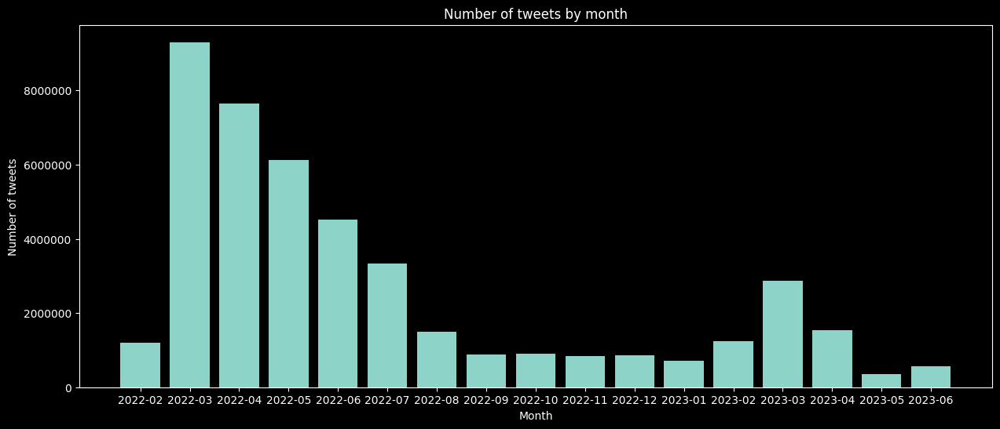

In [38]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(15, 6))
plt.style.use('dark_background')
plt.bar(res.index, res[0].values)
ax.ticklabel_format(axis='y', style='plain')
ax.set_xlabel('Month')
ax.set_ylabel('Number of tweets')
ax.set_title('Number of tweets by month')

In [419]:
df

,tweetid,location,tweetcreatedts,followers,text,language,hashtags,month
0,1509681950042198030,Hawaii,2022-04-01 00:00:00.000000,392,⚡The Ukrainian Air Force would like to address...,en,"[#ProtectU, #StopRussia, #UkraineUnderAtta]",2022-04
1,1509681950151348229,NaN,2022-04-01 00:00:00.000000,881,Chernihiv oblast. Ukrainians welcome their lib...,en,"[#russianinvasion, #StandWithUkraine, #Ukraine...",2022-04
2,1509681950683926556,NaN,2022-04-01 00:00:00.000000,72,America 🇺🇸 is preparing for something worse th...,en,"[#RussianUkrainianWar, #China, #Taiwan]",2022-04
3,1509681951116046336,International Web Zone,2022-04-01 00:00:00.000000,377,JUST IN: #Anonymous has hacked &amp; released ...,en,"[#Anonymous, #OpRussia, #DDoSecrets]",2022-04
4,1509681951304990720,Hunter Account,2022-04-01 00:00:00.000000,25,***PUBLIC MINT NOW LIVE***\n\nFor \n@billionai...,en,"[#nft, #mint]",2022-04
...,...,...,...,...,...,...,...,...
44416748,1509677720514433028,"North Logan, UT",2022-03-31 23:43:11.000000,4101,"Amb. William Taylor, former U.S. Ambassador to...",en,"[#Ukraine, #TheReidOut]",2022-03
44416749,1509677722590605313,NaN,2022-03-31 23:43:12.000000,150,@lapatina_ @berehulak this just hurts my heart...,en,[#Ukraine],2022-03
44416750,1509677723136020480,NaN,2022-03-31 23:43:12.000000,348,"@Abiy Ahmed, Eritrean dictator Isaias Afewerki...",en,"[#Tigray, #Ukraine, #TigrayGenocide, #supportHR]",2022-03
44416751,1509677724490641410,The America's,2022-03-31 23:43:12.000000,845,"#MARIUPOL—However, even at #Ilyich, #Ukraine|i...",en,"[#MARIUPOL, #Ilyich, #Ukraine, #Azov, #Azov, #...",2022-03


## 2

In [431]:
#2
tmp = df[df['location'].isin(location_list)][['location','month']]
for li in tqdm(lists.items()):
    for val in tqdm(li[1]):
        tmp['location'].replace({val:li[0]}, inplace=True)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

In [432]:
tmp

,location,month
7,India,2022-04
10,Dubai,2022-04
11,Canada,2022-04
13,UK,2022-04
16,USA,2022-04
...,...,...
44416712,UK,2022-03
44416721,USA,2022-03
44416738,USA,2022-03
44416739,UK,2022-03


In [441]:
tmp.location.unique()

array(['India', 'Dubai', 'Canada', 'UK', 'USA', 'Other', 'Romania',
       'Ukraine', 'Pakistan', 'Australia', 'Georgia', 'Portugal',
       'Nigeria', 'South Africa', 'Spain', 'Greece', 'Singapore', 'Japan',
       'Luxembourg', 'Sweden', 'Indonesia', 'Hong Kong', 'Germany',
       'Finland', 'Malaysia', 'Estonia', 'Poland', 'Southeast Asia ',
       'Turkey', 'Swidtherland', 'New Zealand', 'France', 'Belgium',
       '127.0.0.1', 'Republic of the Philippines', 'Italy', 'Norway',
       'Czech', 'STAR WARS ', 'Venezuela', 'Taiwan', 'Israel',
       'Nairobi, Kenya', '🌎-I FOLLOW IN 24 ⌛️hrs /LESS', 'Netherland',
       'Iceland', 'Brasil', 'Bangkok, Thailand', 'Sri Lanka',
       'Dhaka, Bangladesh', 'Wien, Österreich', 'Denmark', 'Libya',
       'Tallinn, Estonia', 'Latvia', 'Lithuania', 'E', 'ليبيا', 'libya',
       "Putin's Large Intestine."], dtype=object)

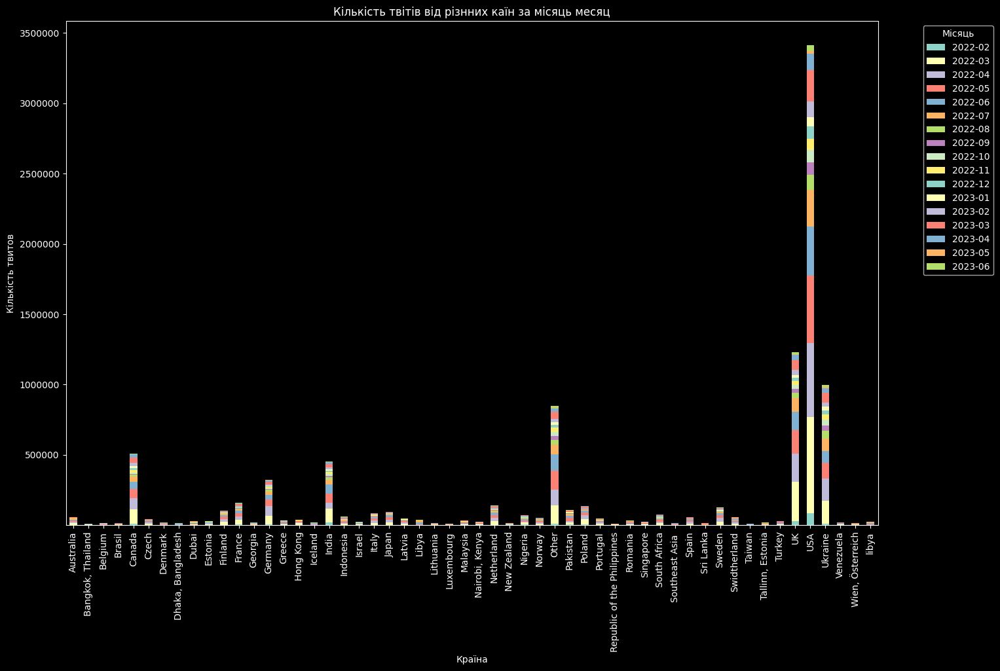

In [446]:
result = tmp.groupby(['location', 'month']).size().unstack()
result.drop(['127.0.0.1','E','🌎-I FOLLOW IN 24 ⌛️hrs /LESS','ليبيا','STAR WARS ',"Putin's Large Intestine."], axis=0, inplace=True)
# Построение столбчатой диаграммы с накоплением
ax = result.plot(kind='bar', stacked=True, figsize=(16, 10))

ax.ticklabel_format(axis='y', style='plain')
# Настройка заголовка и меток осей
ax.set_title('Кількість твітів від різнних каїн за місяць месяц')
ax.set_xlabel('Країна')
ax.set_ylabel('Кількість твитов')
ax.legend(title='Місяць', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [58]:
res = df[['location','month']].groupby(['location']).apply(lambda g: pd.Series([len(g), g.month.value_counts()]))
res

,0,1
location,,
China,5,2022-05 1 2022-08 1 2022-11 1 2023-01...
\t,49,2022-03 19 2022-04 16 2022-05 8 2022...
\t\t— (+63) • 🔞 • s/her \n\t\t— ot7♡ | 211024 JK bu: @softforjeon_ \n\t\t— rcbyf • sb to unf!,1,"2022-06 1 Name: month, dtype: int64"
"\t San Francisco, CA",5,2022-03 2 2022-05 1 2022-09 1 2022-10...
\t.JRD07.,1,"2022-05 1 Name: month, dtype: int64"
...,...,...
🫶🏻 🫰,1,"2022-05 1 Name: month, dtype: int64"
🫶🏻@caspianspook🫶🏻,1,"2022-06 1 Name: month, dtype: int64"
🫶🏽,1,"2022-03 1 Name: month, dtype: int64"


In [239]:
#res['sum'] = sum_list
res = res[res[0]>11000]

location_list = list(res.sort_values(0, ascending=False).index)
location_list

['United States',
 'Ukraine',
 'USA',
 'India',
 'Україна',
 'London',
 'London, England',
 'Canada',
 'United Kingdom',
 'Washington, DC',
 'Earth',
 'UK',
 'England, United Kingdom',
 'Украина',
 'Europe',
 'California, USA',
 'World',
 'Germany',
 'Los Angeles, CA',
 'Florida, USA',
 'Australia',
 'Kyiv, Ukraine',
 'New York, NY',
 'New York, USA',
 'Planet Earth',
 'Global',
 'Kyiv',
 'Colorado, USA',
 'Texas, USA',
 'France',
 'New Delhi, India',
 'Toronto, Ontario',
 'Deutschland',
 'Houston, TX',
 'Indonesia',
 'Paris, France',
 'Everywhere',
 'Chicago, IL',
 'Worldwide',
 'New York',
 'Brussels, Belgium',
 'The Netherlands',
 'Ireland',
 'Sweden',
 'Austin, TX',
 'Internet',
 'Polska',
 'Finland',
 'Berlin, Germany',
 'London, UK',
 'Pakistan',
 'Mumbai, India',
 'Brussels',
 'Florida',
 'Chennai, India',
 'Hong Kong',
 'Berlin',
 'Italia',
 'Las Vegas, NV',
 'Toronto',
 'Texas',
 'Libya',
 'Yes',
 'England',
 'Warszawa, Polska',
 'South Africa',
 'Seattle, WA',
 'Lagos, Nigeri

In [347]:
usa_list = []
for i in location_list:
    if re.findall('USA|America|Lost in the Minnesota North Woods|Colorado|San Francisco|, [A-Z]{2}|New Jersey|Ohio|United States|us|NYC|New York|California|Florida|Los Angeles|Texas|Chicago|Virginia|US|Washington', i):
        #print(i)
        usa_list.append(i)
usa_list.remove('London, UK')
usa_list

['United States',
 'USA',
 'Washington, DC',
 'California, USA',
 'Los Angeles, CA',
 'Florida, USA',
 'Australia',
 'New York, NY',
 'New York, USA',
 'Colorado, USA',
 'Texas, USA',
 'Houston, TX',
 'Chicago, IL',
 'New York',
 'Brussels, Belgium',
 'Austin, TX',
 'Brussels',
 'Florida',
 'Las Vegas, NV',
 'Texas',
 'Seattle, WA',
 'San Diego, CA',
 'Pennsylvania, USA',
 'New Jersey, USA',
 'San Francisco, CA',
 'NYC',
 'Doghouse',
 'California',
 'Los Angeles',
 'Atlanta, GA',
 'New York City',
 'Virginia, USA',
 'Boston, MA',
 'Kentucky, USA',
 'North Carolina, USA',
 'Miami, FL',
 'Ohio, USA',
 'Langley, Virginia',
 'Massachusetts, USA',
 'Arizona, USA',
 'Portland, OR',
 'Dallas, TX',
 'Michigan, USA',
 'United States of America',
 'Georgia, USA',
 'Washington DC',
 'Washington, D.C.',
 'us',
 'Washington, USA',
 'Brooklyn, NY',
 'Philadelphia, PA',
 'Oregon, USA',
 'US',
 'Vienna, Austria',
 'Minnesota, USA',
 'Chicago',
 'Maryland, USA',
 'Russia',
 'Illinois, USA',
 'Vilnius, 

In [348]:
china_list = []
for i in location_list:
    if re.findall('china', i.lower()):
        china_list.append(i)
china_list

[]

In [349]:
uk_list = []
for i in location_list:
    if re.findall('UK|United Kingdom|London|England|Ireland|Scotland|British|Dublin|Ireland', i):
        print(i)
        uk_list.append(i)

London
London, England
United Kingdom
UK
England, United Kingdom
Ireland
London, UK
England
Scotland, United Kingdom
Scotland
Vancouver, British Columbia
Dublin City, Ireland
South East, England
Manchester, England
Dublin, Ireland
Edinburgh, Scotland
Glasgow, Scotland
London, United Kingdom
The North of England
Dublin
Cork, Ireland
South West, England
British Columbia, Canada


In [350]:
france_list = []
for i in location_list:
    if re.findall('france|paris', i.lower()):
        print(i)
        france_list.append(i)

France
Paris, France
Paris


In [351]:
ua_list = []
for i in location_list:
    if re.findall('ukrain|україна|ua |украина|kyiv|київ|киев', i.lower()):
        print(i)
        ua_list.append(i)

Ukraine
Україна
Украина
Kyiv, Ukraine
Kyiv
Ukraine 
Ukraine, Kyiv
Київ
Хай живе Україна
Киев
Lviv, Ukraine
Kyiv 🇺🇦


In [352]:
gr_list = []
for i in location_list:
    if re.findall('germany|berlin|deutschland', i.lower()):
        print(i)
        gr_list.append(i)

Germany
Deutschland
Berlin, Germany
Berlin
Berlin, Deutschland
Lübeck, Germany
Hamburg, Deutschland
Bayern, Deutschland


In [353]:
be_list = []
for i in location_list:
    if re.findall('belgium|brussels', i.lower()):
        print(i)
        be_list.append(i)

Brussels, Belgium
Brussels
Belgium


In [354]:
ind_list = []
for i in location_list:
    if re.findall('india|delhi|mumbai', i.lower()):
        print(i)
        ind_list.append(i)

India
New Delhi, India
Mumbai, India
Chennai, India
New Delhi
Hyderabad, India
Bengaluru, India
Kolkata, India
Mumbai


In [355]:
ca_list = []
for i in location_list:
    if re.findall('canada|toronto|québec|ottawa|alberta|seattle|montreal', i.lower()):
        print(i)
        ca_list.append(i)

Canada
Toronto, Ontario
Toronto
Seattle, WA
Toronto, Canada
Ontario, Canada
Ottawa, Ontario
Montréal, Québec
Calgary, Alberta
Québec, Canada
Toronto, Ontario, Canada
Alberta, Canada
Montreal
Edmonton, Alberta
British Columbia, Canada
Seattle


In [356]:
it_list = []
for i in location_list:
    if re.findall('ital|milano', i.lower()):
        print(i)
        it_list.append(i)

Italia
Italy
Milano, Lombardia


In [357]:
po_list = []
for i in location_list:
    if re.findall('pol', i.lower()):
        print(i)
        po_list.append(i)

Polska
Warszawa, Polska
Poland
Warsaw, Poland
Minneapolis, MN


In [358]:
ne_list = []
for i in location_list:
    if re.findall('neth|ned|amster', i.lower()):
        print(i)
        ne_list.append(i)

The Netherlands
Nederland
Netherlands
Amsterdam
Amsterdam, The Netherlands


In [359]:
pa_list = []
for i in location_list:
    if re.findall('pakistan', i.lower()):
        print(i)
        pa_list.append(i)

Pakistan
Karachi, Pakistan
Islamabad, Pakistan
Lahore, Pakistan


In [360]:
other_list = []
for i in location_list:
    if re.findall('world|europe|internet|earth|yes|global|everywhere|doghouse|1,new church st tetbury gl88ds|mars|metaverse|eu', i.lower()):
        print(i)
        other_list.append(i)
other_list.remove('Berlin, Deutschland')
other_list.remove('Hamburg, Deutschland')
other_list.remove('Bayern, Deutschland')

Earth
Europe
World
Planet Earth
Global
Deutschland
Everywhere
Worldwide
Internet
Yes
Berlin, Deutschland
Doghouse
EU
1,New church st tetbury Gl88DS
Metaverse
Citizen of The World
The World
Mars
Hamburg, Deutschland
planet earth
worldwide
Bayern, Deutschland


In [361]:
nig_list = []
for i in location_list:
    if re.findall('niger', i.lower()):
        print(i)
        nig_list.append(i)

Lagos, Nigeria
Nigeria


In [362]:
afr_list = []
for i in location_list:
    if re.findall('afr', i.lower()):
        print(i)
        afr_list.append(i)

South Africa
Johannesburg, South Africa
Cape Town, South Africa


In [363]:
fin_list = []
for i in location_list:
    if re.findall('fin|helsinki|suomi', i.lower()):
        print(i)
        fin_list.append(i)

Finland
Helsinki, Finland
Suomi
Helsinki, Suomi


In [364]:
swe_list = []
for i in location_list:
    if re.findall('sverige|sweden|stockholm', i.lower()):
        print(i)
        swe_list.append(i)

Sweden
Sverige
Stockholm, Sverige
Stockholm, Sweden
Stockholm


In [365]:
spa_list = []
for i in location_list:
    if re.findall('spa|madr', i.lower()):
        print(i)
        spa_list.append(i)

Spain
España
Madrid


In [366]:
au_list = []
for i in location_list:
    if re.findall('sydney|ustralia|melbourn', i.lower()):
        print(i)
        au_list.append(i)

Australia
Melbourne, Victoria
Sydney, New South Wales
Perth, Western Australia
Sydney, Australia
Sydney


In [405]:
ja_list = []
for i in location_list:
    if re.findall('japan|日本|日本 東京', i.lower()):
        print(i)
        ja_list.append(i)

Japan
日本
JAPAN
日本 東京
Tokyo, Japan


In [368]:
ro_list = []
for i in location_list:
    if re.findall('roma', i.lower()):
        print(i)
        ro_list.append(i)

Romania
Bucharest, Romania


In [369]:
cz_list = []
for i in location_list:
    if re.findall('prague|czech|esk', i.lower()):
        print(i)
        cz_list.append(i)

Česká republika
Czech Republic
Prague, Czech Republic


In [370]:
du_list = []
for i in location_list:
    if re.findall('dubai', i.lower()):
        print(i)
        du_list.append(i)

Dubai, United Arab Emirates
Dubai


In [371]:
gre_list = []
for i in location_list:
    if re.findall('gre', i.lower()):
        print(i)
        gre_list.append(i)

Athens, Greece
Greece


In [372]:
tur_list = []
for i in location_list:
    if re.findall('tur|tü', i.lower()):
        print(i)
        tur_list.append(i)

İstanbul, Türkiye
Istanbul, Turkey


In [373]:
swi_list = []
for i in location_list:
    if re.findall('swi|zurich', i.lower()):
        print(i)
        swi_list.append(i)

Switzerland
Geneva, Switzerland
Zurich


In [374]:
nor_list = []
for i in location_list:
    if re.findall('norw|norge', i.lower()):
        print(i)
        nor_list.append(i)

Norway
Oslo, Norway
Norge


In [375]:
por_list = []
for i in location_list:
    if re.findall('portu', i.lower()):
        print(i)
        por_list.append(i)

Portugal
Lisboa, Portugal


In [376]:
mal_list = []
for i in location_list:
    if re.findall('mal', i.lower()):
        print(i)
        mal_list.append(i)

Kuala Lumpur, Malaysia
Malaysia


In [377]:
lat_list = []
for i in location_list:
    if re.findall('latv|riga', i.lower()):
        print(i)
        lat_list.append(i)

Riga
Riga, Latvia
Latvia


In [407]:
lists = {
    'USA': usa_list,
    'Ukraine': ua_list,
    'France': france_list,
    'UK': uk_list,
    'Germany': gr_list,
    'India': ind_list,
    'Belgium': be_list,
    'Canada': ca_list,
    'Italy': it_list,
    'Poland': po_list,
    'Netherland': ne_list,
    'Pakistan': pa_list,
    'Other': other_list,
    'Nigeria': nig_list,
    'South Africa': afr_list,
    'Finland': fin_list,
    'Sweden': swe_list,
    'Spain': spa_list,
    'Australia': au_list,
    'Japan': ja_list,
    'Romania': ro_list,
    'Czech': cz_list,
    'Dubai': du_list,
    'Greece': gre_list,
    'Turkey': tur_list,
    'Swidtherland': swi_list,
    'Norway': nor_list,
    'Portugal': por_list,
    'Malaysia': mal_list,
    'Latvia': lat_list
}

## 3

In [25]:
df['month'] = df['tweetcreatedts'].apply(lambda d: str(d)[:7])
df

,tweetid,location,tweetcreatedts,followers,text,language,hashtags,username,month
0,1509681950042198030,Hawaii,2022-04-01 00:00:00.000000,392,⚡The Ukrainian Air Force would like to address...,en,#ProtectU #StopRussia #UkraineUnderAtta,Yaniela,2022-04
1,1509681950151348229,NaN,2022-04-01 00:00:00.000000,881,Chernihiv oblast. Ukrainians welcome their lib...,en,#russianinvasion #StandWithUkraine #UkraineUnd...,gregffff,2022-04
2,1509681950683926556,NaN,2022-04-01 00:00:00.000000,72,America 🇺🇸 is preparing for something worse th...,en,#RussianUkrainianWar #China #Taiwan,ThanapornThon17,2022-04
3,1509681951116046336,International Web Zone,2022-04-01 00:00:00.000000,377,JUST IN: #Anonymous has hacked &amp; released ...,en,#Anonymous #OpRussia #DDoSecrets,I_Protest_2021,2022-04
4,1509681951304990720,Hunter Account,2022-04-01 00:00:00.000000,25,***PUBLIC MINT NOW LIVE***\n\nFor \n@billionai...,en,#nft #mint,Marsh_Win_01,2022-04
...,...,...,...,...,...,...,...,...,...
44416748,1509677720514433028,"North Logan, UT",2022-03-31 23:43:11.000000,4101,"Amb. William Taylor, former U.S. Ambassador to...",en,#Ukraine #TheReidOut,snarky_op,2022-03
44416749,1509677722590605313,NaN,2022-03-31 23:43:12.000000,150,@lapatina_ @berehulak this just hurts my heart...,en,#Ukraine,AnnMRobie,2022-03
44416750,1509677723136020480,NaN,2022-03-31 23:43:12.000000,348,"@Abiy Ahmed, Eritrean dictator Isaias Afewerki...",en,#Tigray #Ukraine #TigrayGenocide #supportHR,tsion_tigray,2022-03
44416751,1509677724490641410,The America's,2022-03-31 23:43:12.000000,845,"#MARIUPOL—However, even at #Ilyich, #Ukraine|i...",en,#MARIUPOL #Ilyich #Ukraine #Azov #Azov #DNR,TLBSociety,2022-03


In [26]:
res = df[['month','hashtags']].groupby('month').apply(lambda g: pd.Series([' '.join(g.hashtags.values)]))
res

,0
month,
2022-02,#Ukraine #Russia #ITVideo #Russia #Ukraine #Ky...
2022-03,#coronavirus #Russia #Ukraine #RussiaUkraine #...
2022-04,#ProtectU #StopRussia #UkraineUnderAtta #russi...
2022-05,#StopRussianOil #StopRussiaNow #Politics #Art ...
2022-06,#ArchaicAgeofDarkess #tabletopgames #ttrpgcomm...
2022-07,#News #Politics #Washington #DC #Hacking #Cybe...
2022-08,#RussiaUkraine #UkraineCrisis #NATO #Yugoslavi...
2022-09,#Dragons #Hydra #War #PVP #Win #Hardcore #NEW ...
2022-10,#InternationalMusicDay #StandWithUkraine #WWII...


  0%|          | 0/17 [00:00<?, ?it/s]

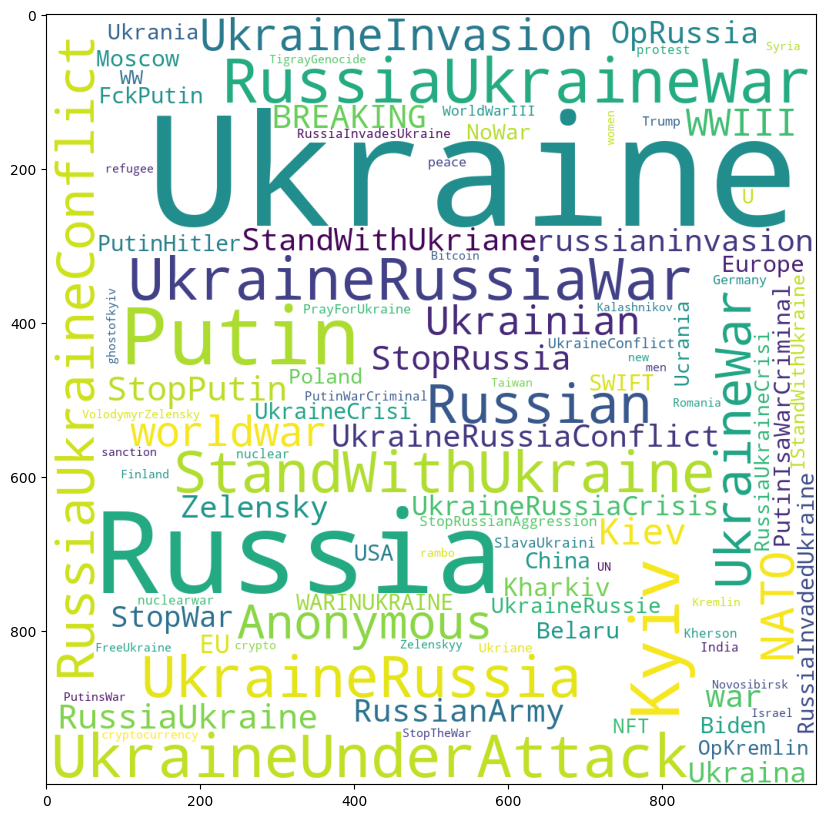

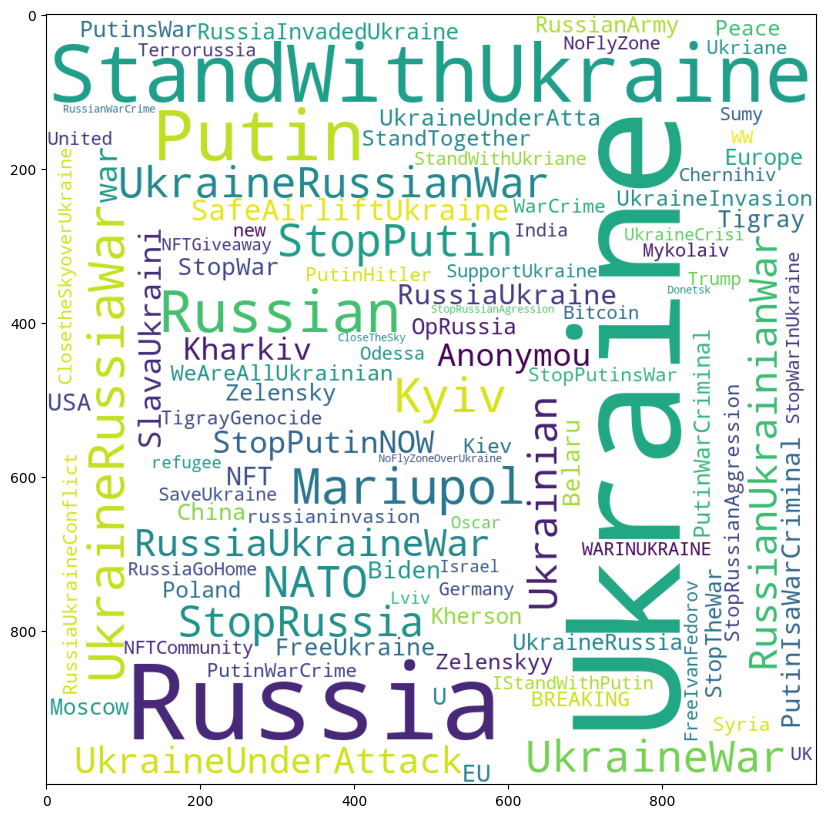

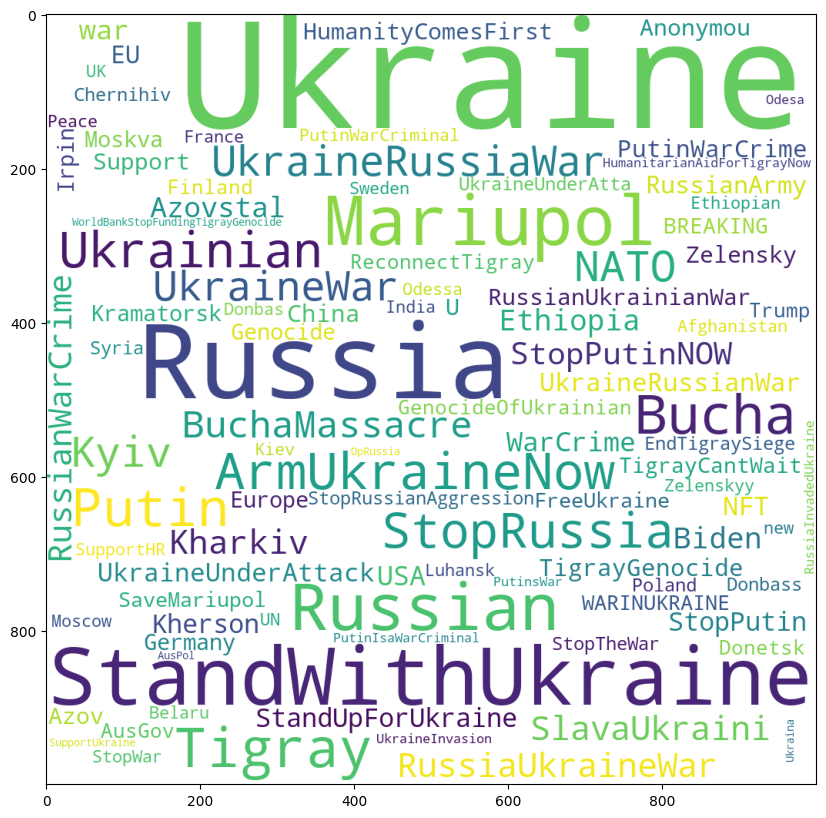

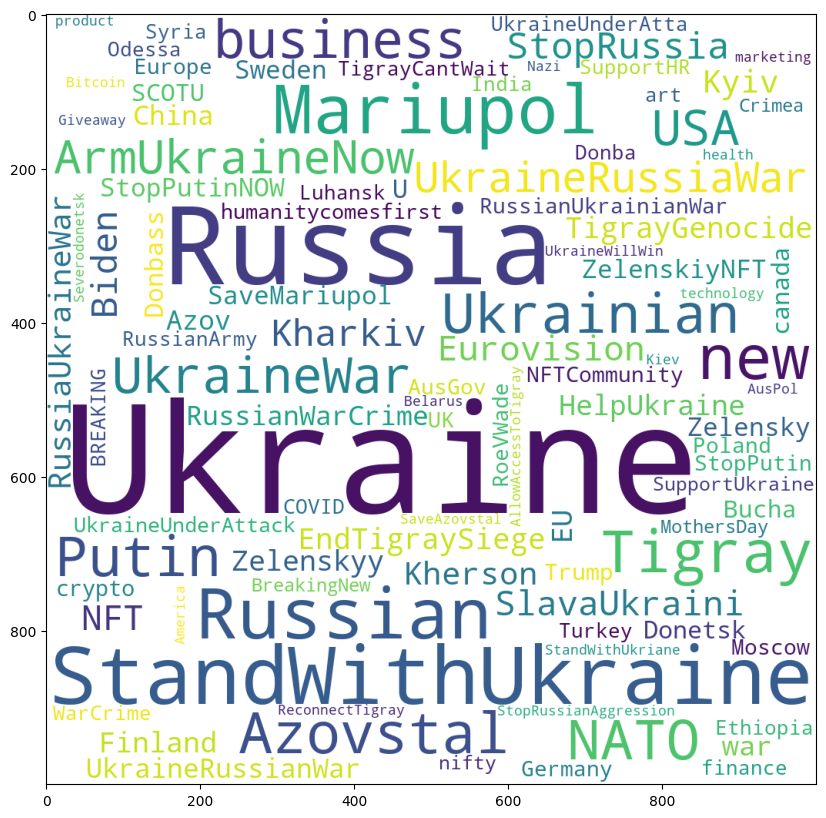

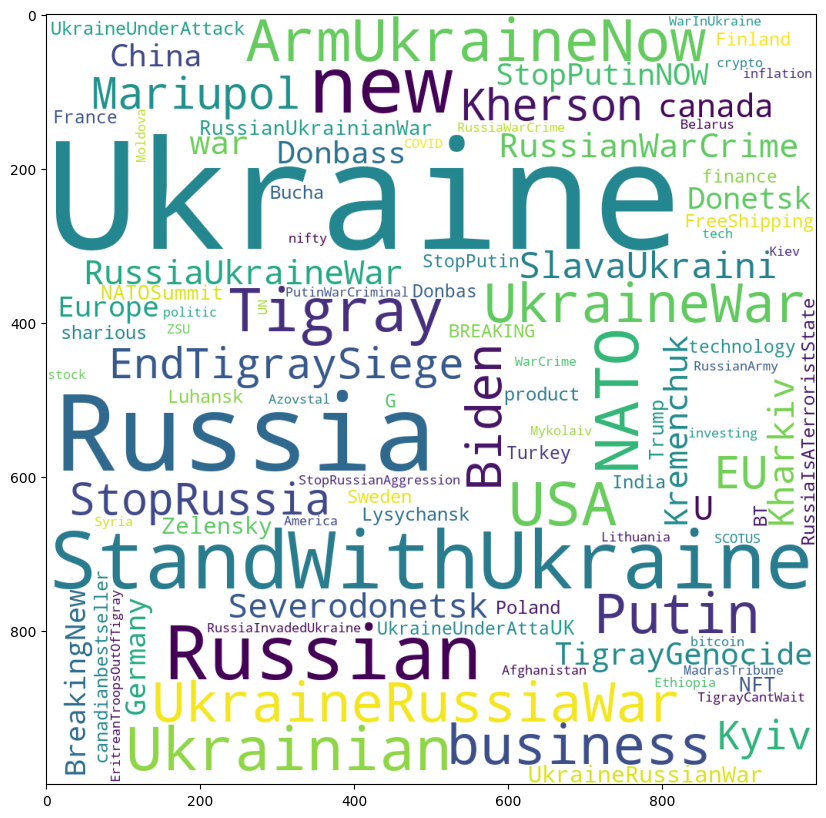

...

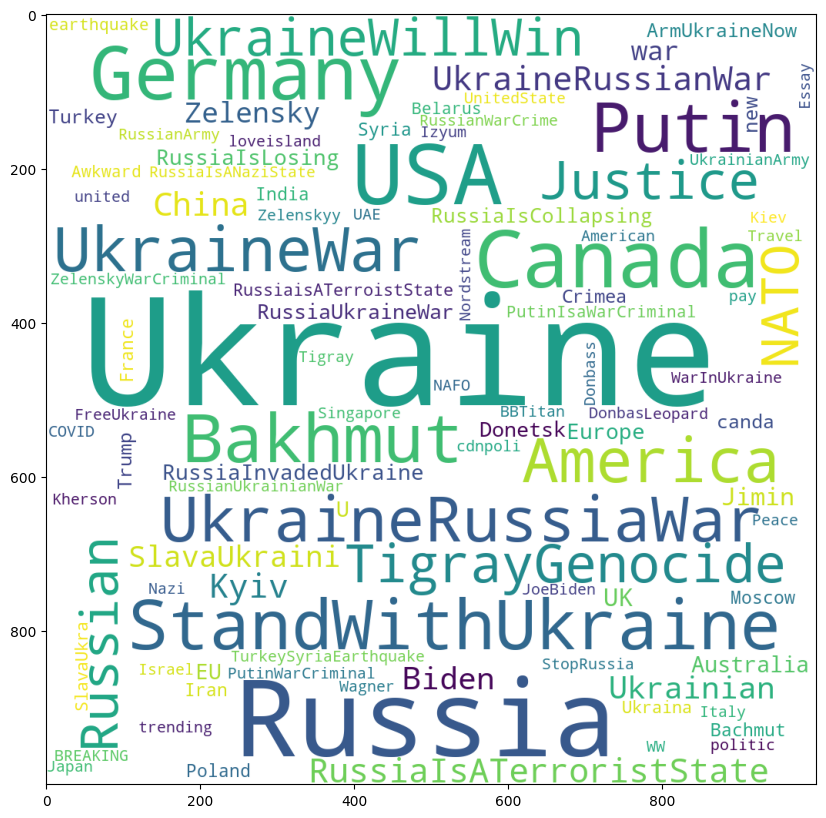

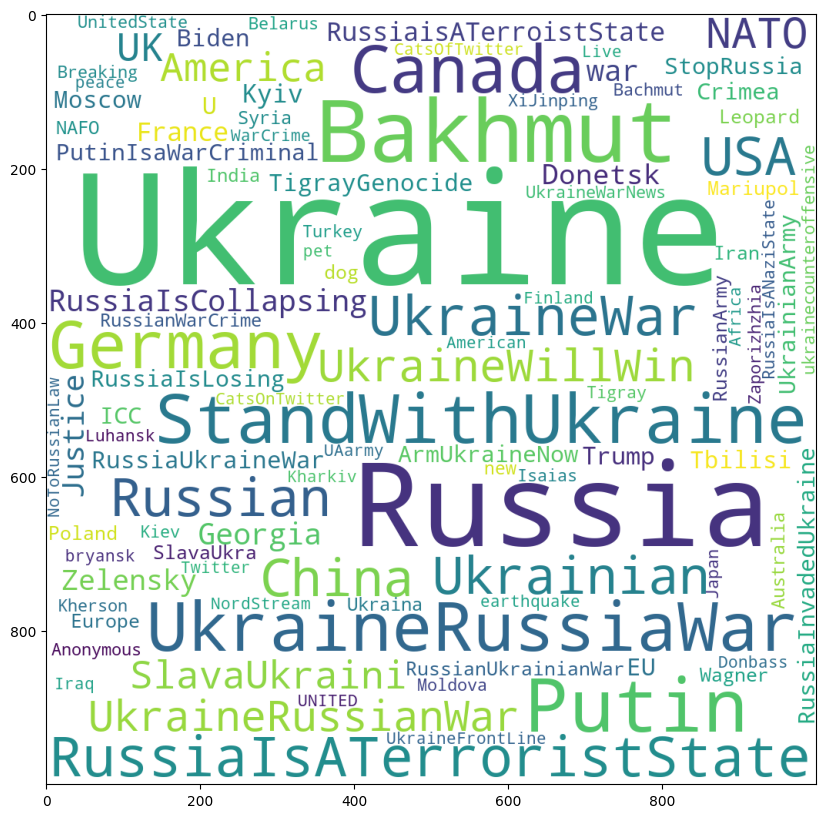

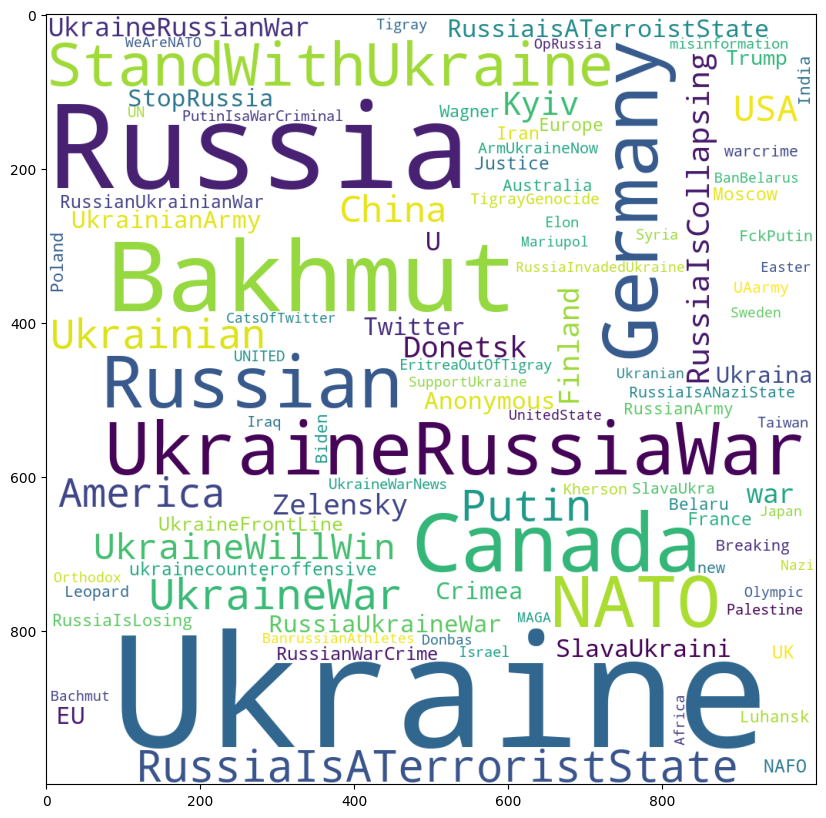

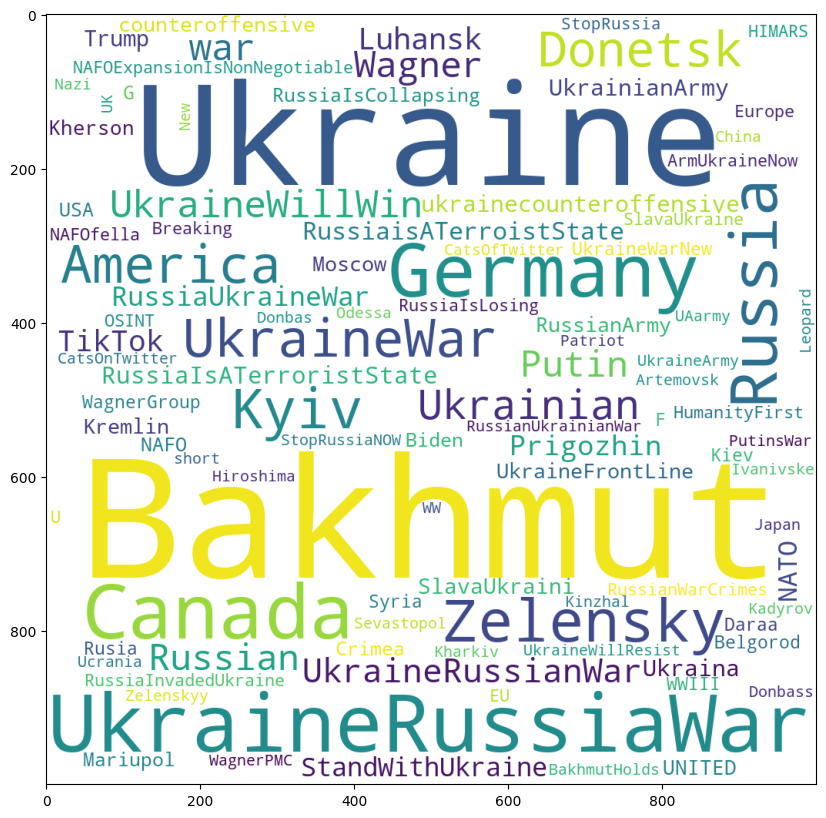

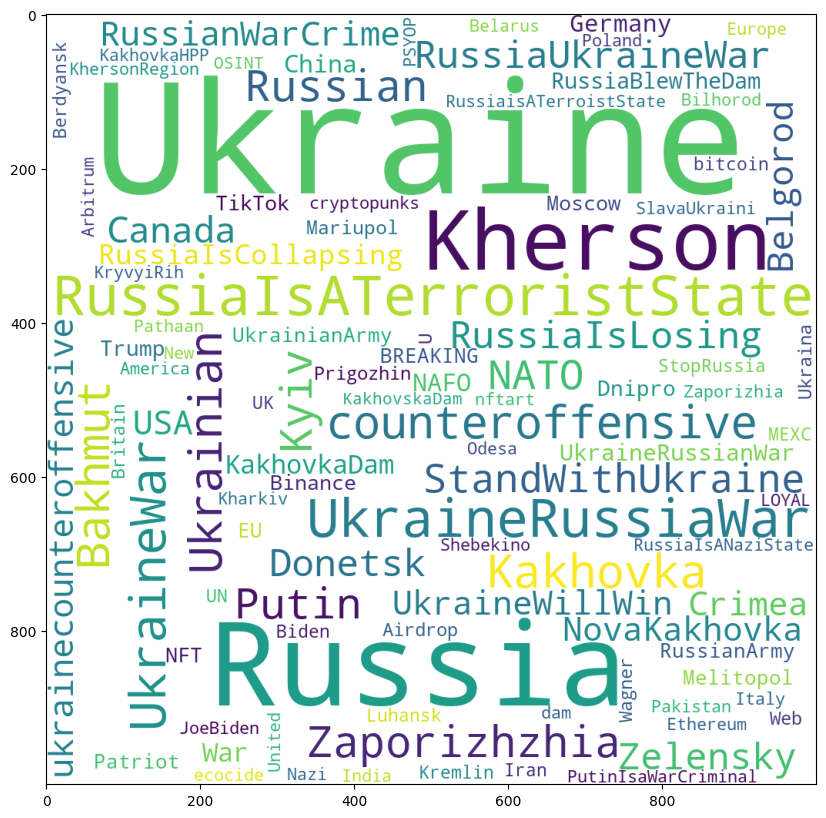

In [27]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
for date in tqdm(res.index):
    wordCloud = WordCloud(width = 1000, height = 1000,
                background_color ='white',
                max_words=100,
                collocations=False,          
                min_font_size = 10).generate(res.loc[date][0])
    plt.figure(figsize=(10,10))
    plt.imshow(wordCloud)

## 4

In [114]:
from collections import Counter
hash = []
popular_hash = {}
for i in res.index:
    popular_hash.update({i:Counter(res.loc[i][0].split(' ')).most_common(10)})
    hash += [j[0] for j in Counter(res.loc[i][0].split(' ')).most_common(10)]

In [115]:
data = popular_hash

In [116]:
# Создаем словарь для хранения данных
from collections import defaultdict
hashtags_data = defaultdict(list)

# Создаем множество всех хештегов
all_hashtags = set(hashtag for hashtags_count in data.values() for hashtag, _ in hashtags_count)
N=0
# Обходим каждый месяц и его данные
for month, hashtags_count in data.items():
    hashtags_count_dict = dict(hashtags_count)
    N=0
    for hashtag in all_hashtags: 
        N+=1
        if hashtags_count_dict.get(hashtag):
            count = N
        else: 
            count=0
        hashtags_data[hashtag].append(count)

# Убеждаемся, что у каждого хештега есть 17 значений
for hashtag in hashtags_data:
    hashtags_data[hashtag] += [0] * (17 - len(hashtags_data[hashtag]))

# Выводим результат
for hashtag, counts in hashtags_data.items():
    print(f"{hashtag}: {counts}")

#RussiaIsATerroristState: [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1]
#UkraineRussia: [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
#Biden: [0, 0, 0, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0]
#Canada: [0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 0]
#Bucha: [0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
#Azovstal: [0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
#Zaporizhzhia: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7]
#NATO: [0, 0, 0, 8, 8, 8, 0, 0, 8, 8, 0, 0, 0, 0, 8, 0, 0]
#GazaUnderAttack: [0, 0, 0, 0, 0, 0, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
#Mariupol: [0, 10, 10, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
#StandWithUkraine: [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 0, 11, 11, 11, 0, 0]
#ArmUkraineNow: [0, 0, 12, 0, 12, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
#ukraine: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 13]
#TigrayGenocide: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14, 0, 0, 0, 0]
#Gaza: [0, 0, 0, 0, 0, 0, 15, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [118]:
res.index

Index(['2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07',
       '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01',
       '2023-02', '2023-03', '2023-04', '2023-05', '2023-06'],
      dtype='object', name='month')

In [149]:
data = hashtags_data
[i[0] for i in sorted(data.items(), key=lambda x: x[1].count(0), reverse=False)]

['#Ukraine',
 '#Russia',
 '#StandWithUkraine',
 '#UkraineRussiaWar',
 '#Putin',
 '#Russian',
 '#RussiaIsATerroristState',
 '#Canada',
 '#Germany',
 '#Bakhmut',
 '#NATO',
 '#Kyiv',
 '#Mariupol',
 '#ArmUkraineNow',
 '#America',
 '#China',
 '#Ukrainian',
 '#UkraineWar',
 '#Tigray',
 '#Biden',
 '#UkraineRussianWar',
 '#USA',
 '#news',
 '#Kherson',
 '#UkraineRussia',
 '#Bucha',
 '#Azovstal',
 '#Zaporizhzhia',
 '#GazaUnderAttack',
 '#ukraine',
 '#TigrayGenocide',
 '#Gaza',
 '#UnitedStates',
 '#Taiwan',
 '#Donetsk',
 '#RussiaUkraineWar',
 '#Zelensky',
 '#StopPutin',
 '#StopRussia',
 '#UkraineUnderAttack',
 '#FIFAWorldCup',
 '#Kakhovka']

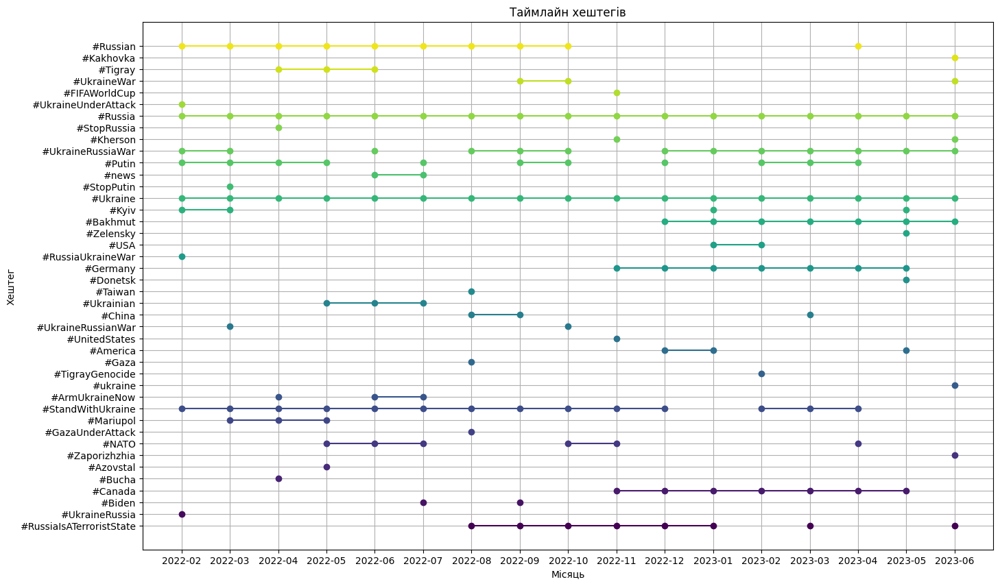

In [148]:
import matplotlib.pyplot as plt

# Данные: хештеги и количество раз для каждого хештега в каждом месяце
data = hashtags_data

# Месяцы
months = list(res.index)
modified_data = {hashtag: [count if count != 0 else None for count in counts] for hashtag, counts in data.items()}

# Создание графика таймлайна
plt.figure(figsize=(16, 10))

# Для каждого хештега
for idx, (hashtag, counts) in enumerate(modified_data.items()):
    plt.plot(months, counts, label=hashtag, marker='o', color=plt.cm.viridis(idx / len(modified_data)))

plt.xlabel('Місяць')
plt.ylabel('Хештег')
plt.title('Таймлайн хештегів')
plt.yticks(np.arange(1,len(modified_data)+1), list(modified_data.keys()))
plt.grid(True)
plt.show()


## 5

In [34]:
import pandas as pd
df = pd.read_csv('sentimentDF.csv')
df

,location,text,month,clean_text,prediction
0,Libya,Videos Appear to Show Ukrainian Troops Shootin...,2023-05,Videos Appear to Show Ukrainian Troops Shootin...,Negative
1,USA,Today (apr 25 2023) Ukrainian forces use HIMAR...,2023-05,Today (apr 25 2023) Ukrainian forces use HIMAR...,Positive
2,USA,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive
3,Canada,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive
4,USA,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive
...,...,...,...,...,...
161024,USA,Don't just get mad. Get busy.\n1-Donate https:...,2023-06,Don't just get mad. Get busy.1-Donate 2-Shop ...,Positive
161025,Germany,7 marines of the 38th brigade of the Armed For...,2023-06,7 marines of the 38th brigade of the Armed For...,Neutral
161026,USA,"In #France, the government has uncovered a maj...",2023-06,"In #France, the government has uncovered a maj...",Negative
161027,Italy,💔Last day of the school year in a Ukrainian vi...,2023-06,💔Last day of the school year in a Ukrainian vi...,Positive


In [35]:
sent = []
for i in list(df.prediction.values):
    if 'Positive' in i:
        sent.append('Positive')
    elif 'Negative' in i:
        sent.append('Negative')
    else:
        sent.append('Neutral')

In [36]:
df['prediction'] = sent

In [49]:
df['pred_int'] = df['prediction'].replace({'Positive':2,'Negative':0, 'Neutral':1})

In [50]:
df.month.value_counts()

2023-06    100292
2023-05     60737
Name: month, dtype: int64

In [51]:
df.isna().sum()

location      0
text          0
month         0
clean_text    0
prediction    0
pred_int      0
dtype: int64

In [52]:
df.prediction.value_counts()

Positive    64597
Neutral     58814
Negative    37618
Name: prediction, dtype: int64

In [53]:
df

,location,text,month,clean_text,prediction,pred_int
0,Libya,Videos Appear to Show Ukrainian Troops Shootin...,2023-05,Videos Appear to Show Ukrainian Troops Shootin...,Negative,0
1,USA,Today (apr 25 2023) Ukrainian forces use HIMAR...,2023-05,Today (apr 25 2023) Ukrainian forces use HIMAR...,Positive,2
2,USA,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2
3,Canada,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2
4,USA,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2
...,...,...,...,...,...,...
161024,USA,Don't just get mad. Get busy.\n1-Donate https:...,2023-06,Don't just get mad. Get busy.1-Donate 2-Shop ...,Positive,2
161025,Germany,7 marines of the 38th brigade of the Armed For...,2023-06,7 marines of the 38th brigade of the Armed For...,Neutral,1
161026,USA,"In #France, the government has uncovered a maj...",2023-06,"In #France, the government has uncovered a maj...",Negative,0
161027,Italy,💔Last day of the school year in a Ukrainian vi...,2023-06,💔Last day of the school year in a Ukrainian vi...,Positive,2


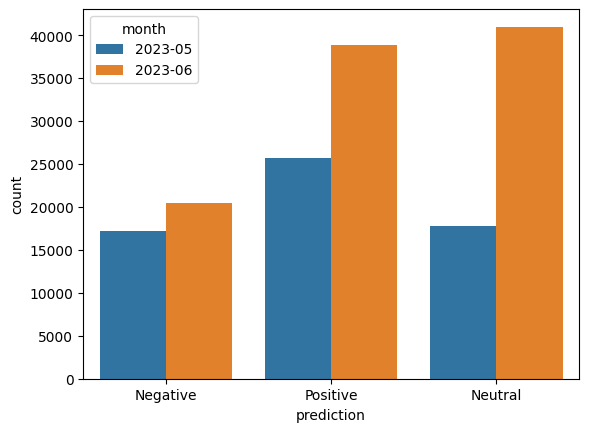

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Предполагаем, что у вас есть DataFrame df с колонками 'country', 'text', 'month', 'sentiment'
sns.countplot(x ='prediction', hue = "month", data = df)
plt.show()

## 6

In [58]:
df.location.nunique()

48

In [65]:
df.pred_int.mean()

1.1675412503337907

<BarContainer object of 10 artists>

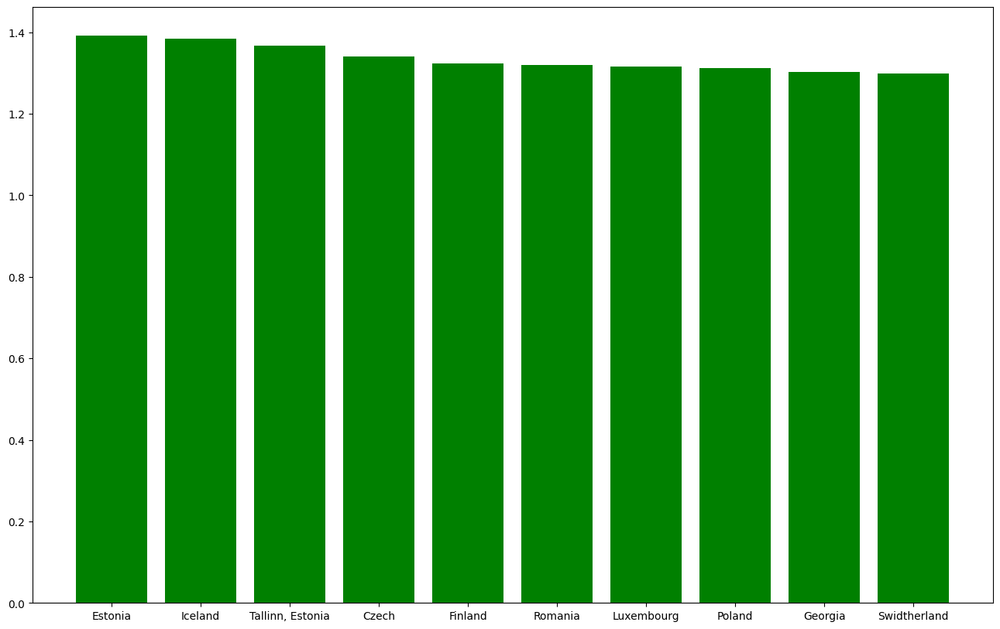

In [86]:
tmp = df.groupby('location').apply(lambda g: pd.Series([g.pred_int.mean()], index=['pred_int_mean'])).sort_values('pred_int_mean',ascending=False)
plt.figure(figsize=(16,10))
plt.bar(tmp.index[:10], tmp['pred_int_mean'][:10], color='green')

<BarContainer object of 10 artists>

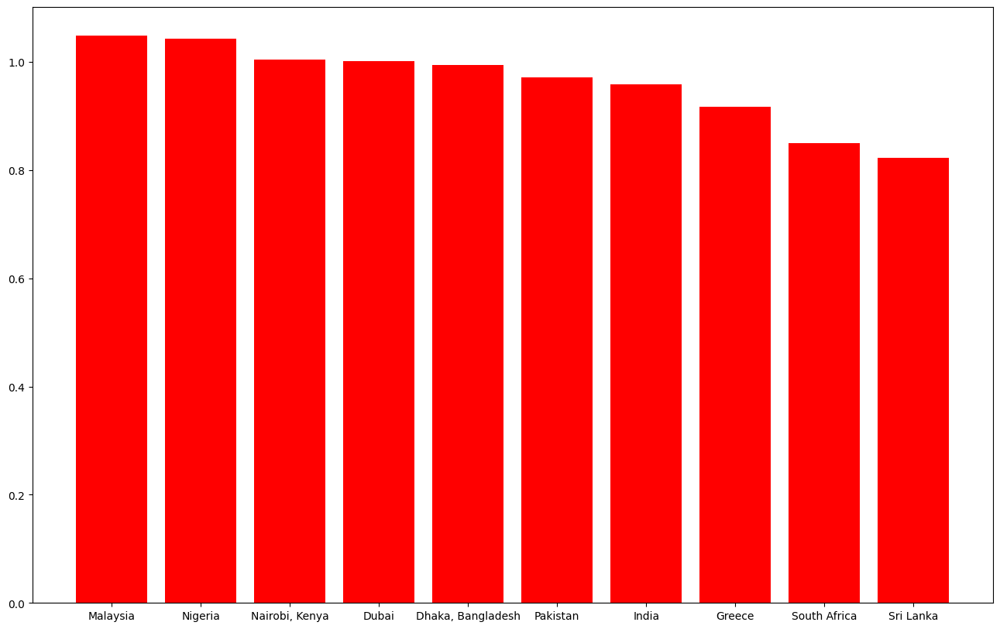

In [88]:
tmp = df.groupby('location').apply(lambda g: pd.Series([g.pred_int.mean()], index=['pred_int_mean'])).sort_values('pred_int_mean',ascending=False)
plt.figure(figsize=(16,10))
plt.bar(tmp.index[-10:], tmp['pred_int_mean'][-10:], color='red')

<BarContainer object of 10 artists>

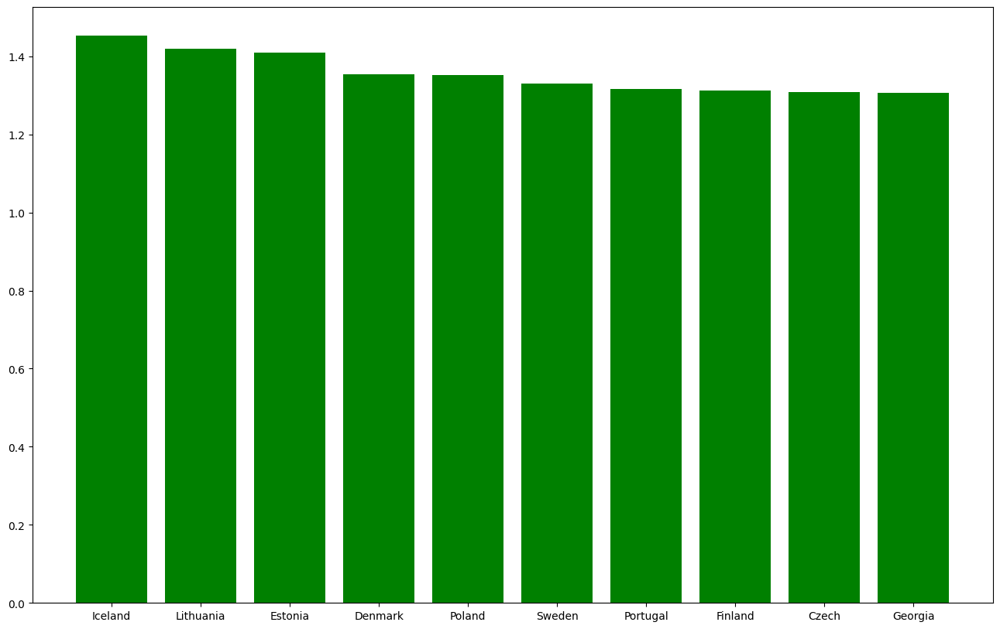

In [82]:
tmp = df[df['month']=='2023-05'].groupby('location').apply(lambda g: pd.Series([g.pred_int.mean()], index=['pred_int_mean'])).sort_values('pred_int_mean',ascending=False)
plt.figure(figsize=(16,10))
plt.bar(tmp.index[:10], tmp['pred_int_mean'][:10], color='green')

<BarContainer object of 10 artists>

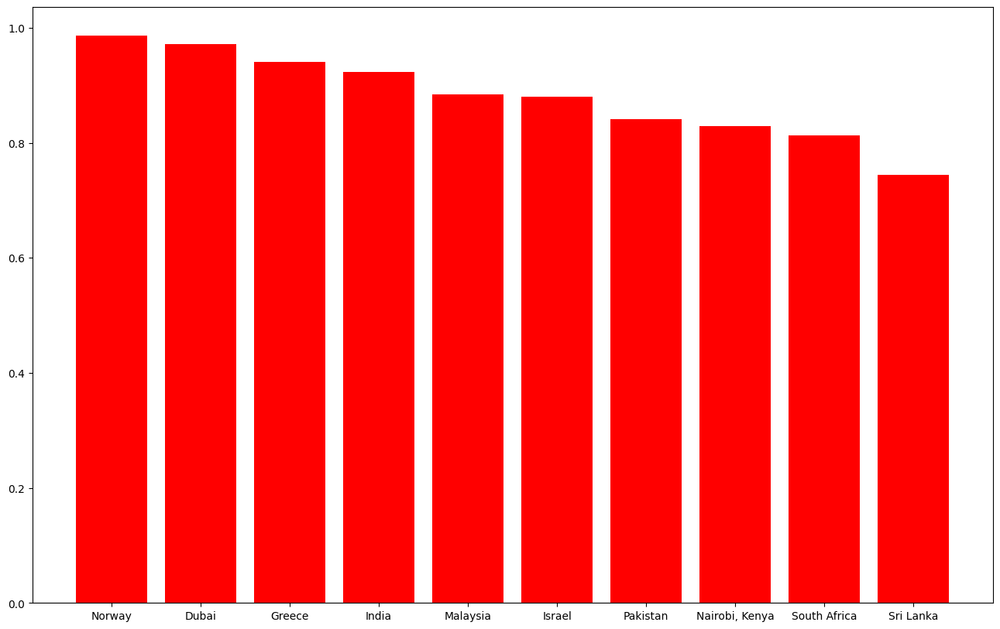

In [83]:
tmp = df[df['month']=='2023-05'].groupby('location').apply(lambda g: pd.Series([g.pred_int.mean()], index=['pred_int_mean'])).sort_values('pred_int_mean',ascending=False)
plt.figure(figsize=(16,10))
plt.bar(tmp.index[-10:], tmp['pred_int_mean'][-10:], color='red')

<BarContainer object of 10 artists>

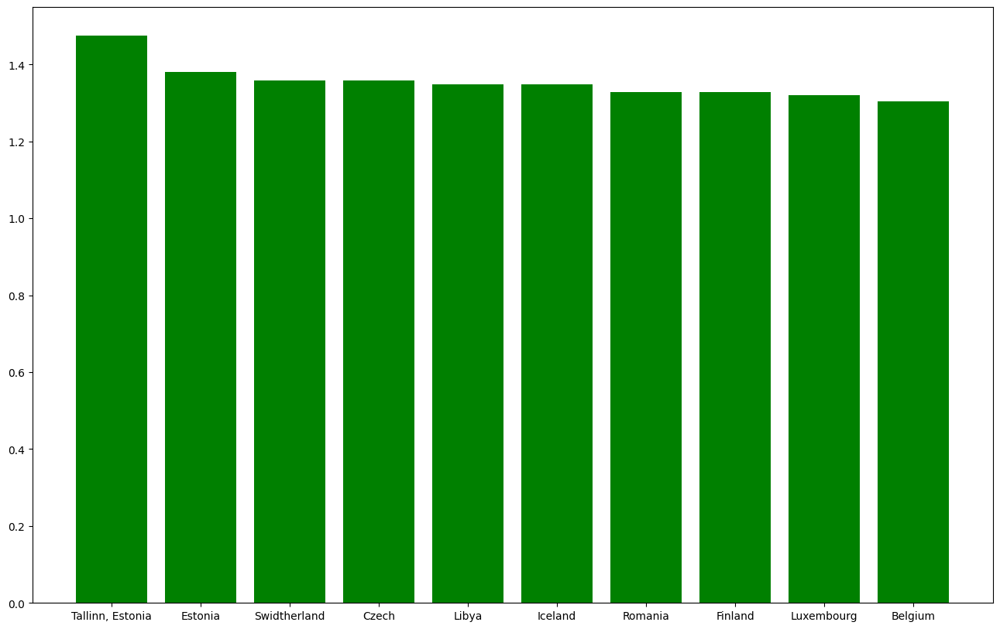

In [84]:
tmp = df[df['month']=='2023-06'].groupby('location').apply(lambda g: pd.Series([g.pred_int.mean()], index=['pred_int_mean'])).sort_values('pred_int_mean',ascending=False)
plt.figure(figsize=(16,10))
plt.bar(tmp.index[:10], tmp['pred_int_mean'][:10], color='green')

<BarContainer object of 10 artists>

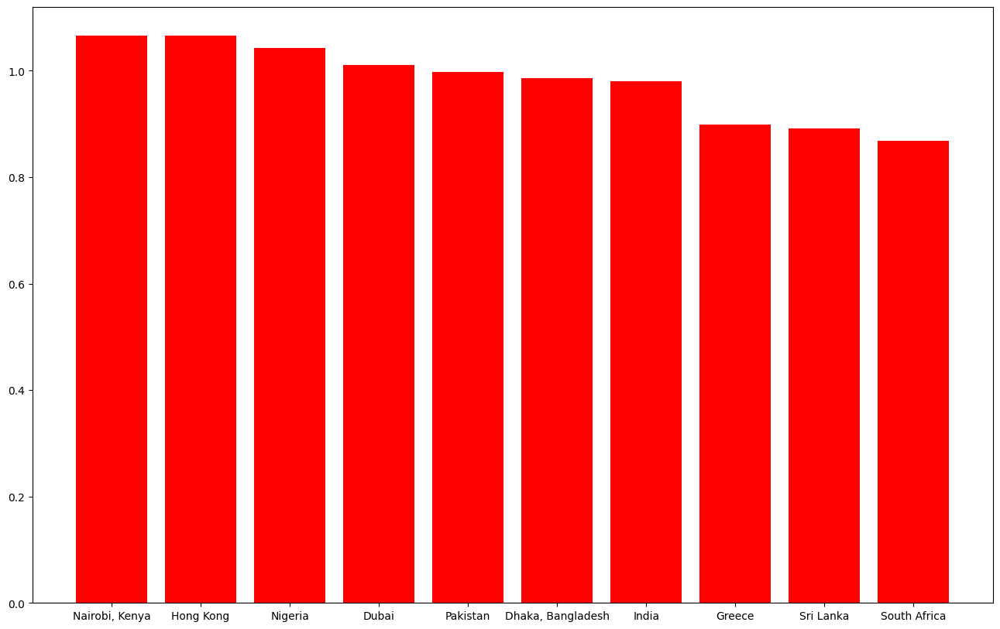

In [85]:
tmp = df[df['month']=='2023-06'].groupby('location').apply(lambda g: pd.Series([g.pred_int.mean()], index=['pred_int_mean'])).sort_values('pred_int_mean',ascending=False)
plt.figure(figsize=(16,10))
plt.bar(tmp.index[-10:], tmp['pred_int_mean'][-10:], color='red')

## 7

In [90]:
df.location.unique()

array(['Libya', 'USA', 'Canada', 'Portugal', 'Japan', 'UK', 'Spain',
       'Poland', 'Luxembourg', 'Netherland', 'India', 'Australia',
       'Indonesia', 'Venezuela', 'Germany', 'Hong Kong', 'Iceland',
       'Singapore', 'Estonia', 'Denmark', 'Finland', 'Nairobi, Kenya',
       'Tallinn, Estonia', 'Norway', 'Lithuania', 'Czech', 'France',
       'Turkey', 'Romania', 'Sri Lanka', 'Italy', 'South Africa',
       'Sweden', 'Latvia', 'Dhaka, Bangladesh', 'Nigeria', 'Pakistan',
       'Dubai', 'Belgium', 'Swidtherland', 'Greece', 'Georgia', 'Israel',
       'New Zealand', 'Malaysia', 'Brasil', 'Taiwan',
       'Republic of the Philippines'], dtype=object)

In [91]:
Europe = ['Portugal','UK', 'Spain',
       'Poland', 'Luxembourg', 'Netherland','Germany','Iceland','Estonia', 'Denmark', 'Finland','Tallinn, Estonia', 'Norway', 'Lithuania', 'Czech', 'France',
       'Turkey', 'Romania','Italy','Sweden', 'Latvia','Belgium', 'Swidtherland', 'Greece', 'Georgia','Israel',]
America = ['USA', 'Canada','Venezuela','Brasil']
Asia = ['India','Japan','Australia','Hong Kong','Sri Lanka', 'Dhaka, Bangladesh','Pakistan',
       'Dubai','Malaysia','Taiwan','Republic of the Philippines']
Oceania =['Australia','Indonesia','Singapore','New Zealand',]
Africa = ['Libya', 'Nairobi, Kenya','South Africa','Nigeria']

In [93]:
continent = []
for i in df.location.values:
    if i in Europe:
        continent.append('Europe')
    elif i in America:
        continent.append('America')
    elif i in Asia:
        continent.append('Asia')
    elif i in Oceania:
        continent.append('Oceania')
    else:
        continent.append('Africa')
df['continent'] = continent

<BarContainer object of 5 artists>

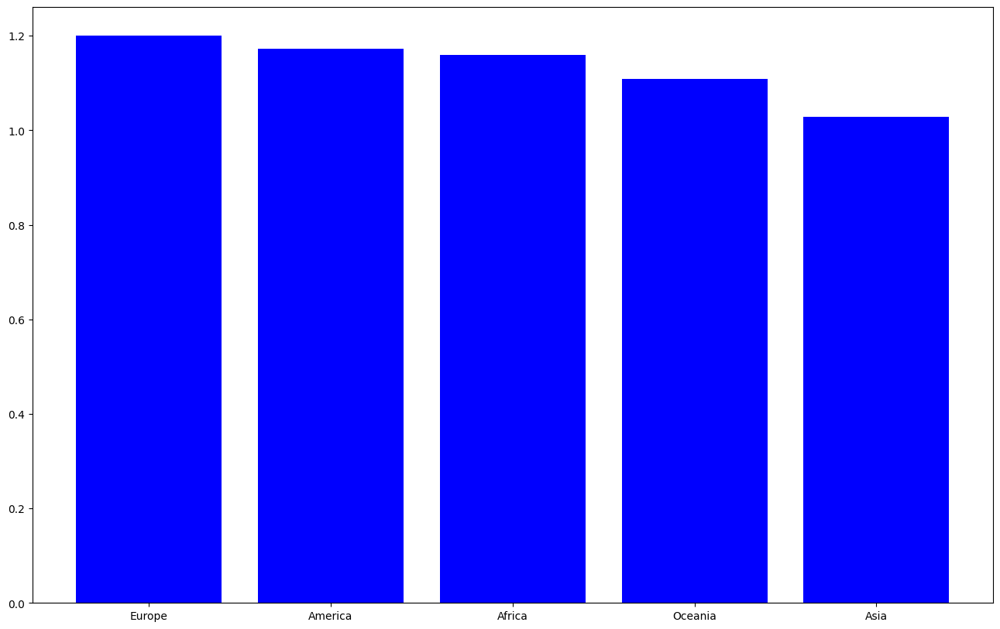

In [98]:
tmp = df.groupby('continent').apply(lambda g: pd.Series([g.pred_int.mean()], index=['pred_int_mean'])).sort_values('pred_int_mean',ascending=False)
plt.figure(figsize=(16,10))
plt.bar(tmp.index, tmp['pred_int_mean'], color='blue')

## 8

In [6]:
df

,tweetid,location,tweetcreatedts,followers,text,language,hashtags,username
0,1509681950042198030,Hawaii,2022-04-01 00:00:00.000000,392,⚡The Ukrainian Air Force would like to address...,en,#ProtectU #StopRussia #UkraineUnderAtta,Yaniela
1,1509681950151348229,NaN,2022-04-01 00:00:00.000000,881,Chernihiv oblast. Ukrainians welcome their lib...,en,#russianinvasion #StandWithUkraine #UkraineUnd...,gregffff
2,1509681950683926556,NaN,2022-04-01 00:00:00.000000,72,America 🇺🇸 is preparing for something worse th...,en,#RussianUkrainianWar #China #Taiwan,ThanapornThon17
3,1509681951116046336,International Web Zone,2022-04-01 00:00:00.000000,377,JUST IN: #Anonymous has hacked &amp; released ...,en,#Anonymous #OpRussia #DDoSecrets,I_Protest_2021
4,1509681951304990720,Hunter Account,2022-04-01 00:00:00.000000,25,***PUBLIC MINT NOW LIVE***\n\nFor \n@billionai...,en,#nft #mint,Marsh_Win_01
...,...,...,...,...,...,...,...,...
44416748,1509677720514433028,"North Logan, UT",2022-03-31 23:43:11.000000,4101,"Amb. William Taylor, former U.S. Ambassador to...",en,#Ukraine #TheReidOut,snarky_op
44416749,1509677722590605313,NaN,2022-03-31 23:43:12.000000,150,@lapatina_ @berehulak this just hurts my heart...,en,#Ukraine,AnnMRobie
44416750,1509677723136020480,NaN,2022-03-31 23:43:12.000000,348,"@Abiy Ahmed, Eritrean dictator Isaias Afewerki...",en,#Tigray #Ukraine #TigrayGenocide #supportHR,tsion_tigray
44416751,1509677724490641410,The America's,2022-03-31 23:43:12.000000,845,"#MARIUPOL—However, even at #Ilyich, #Ukraine|i...",en,#MARIUPOL #Ilyich #Ukraine #Azov #Azov #DNR,TLBSociety


In [ ]:
res = df[['username','location','followers','hashtags']]\
        .groupby('username').apply(lambda g: pd.Series([g.location.unique()[0], g.followers.max(), ' '.join(g.hashtags)]))
res

In [8]:
res = res.sort_values(1, ascending=False)

In [9]:
res

,0,1,2
username,,,
nytimes,New York City,54997992,#Ukraine #Russia #Russia #Ukraine #Russia #Buc...
shakira,Barranquilla,52767632,#Ukraine
PMOIndia,India,47189262,#HTExclusive #Indians #Ukraine
FCBarcelona,NEW KIT 👉,45184165,#BallonDor #ValenciaBar #ValenciaBar #Valencia...
ChampionsLeague,"Nyon, Vaud",43499322,#UCLdraw #UCL #UCLdraw #UCL #UCLdraw #UCL #UCL...
...,...,...,...
Amy_Tracy23,NaN,0,#freetheleopards #ArmUkraineNow
Hdhd72781980,NaN,0,#Giveaway #Ukraine #War
Hdhd43764886,NaN,0,#nft #nfts #nftcommunity #nftcollection #nftar...


In [10]:
res = res[res[1]>500000]

In [11]:
res

,0,1,2
username,,,
nytimes,New York City,54997992,#Ukraine #Russia #Russia #Ukraine #Russia #Buc...
shakira,Barranquilla,52767632,#Ukraine
PMOIndia,India,47189262,#HTExclusive #Indians #Ukraine
FCBarcelona,NEW KIT 👉,45184165,#BallonDor #ValenciaBar #ValenciaBar #Valencia...
ChampionsLeague,"Nyon, Vaud",43499322,#UCLdraw #UCL #UCLdraw #UCL #UCLdraw #UCL #UCL...
...,...,...,...
JackieChristie,United States,501825,#wedding #nbasummerleague #love #Us #DougChris...
AlboMP,"Canberra, Australia",501612,#NATO #NATO
livetennis,Centre Court,501587,#USOpen


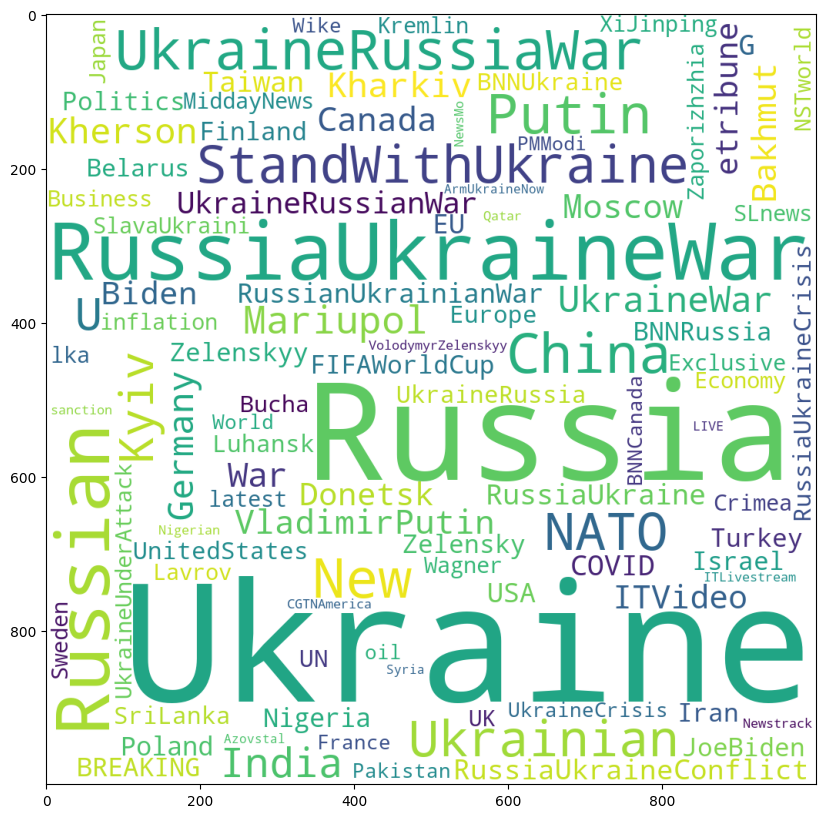

In [20]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
wordCloud = WordCloud(width = 1000, height = 1000,
                background_color ='white',
                max_words=100,
                      collocations=False,
                min_font_size = 10).generate(' '.join(res[2]))
plt.figure(figsize=(10,10))
plt.imshow(wordCloud)

## 9

In [99]:
df

,location,text,month,clean_text,prediction,pred_int,continent
0,Libya,Videos Appear to Show Ukrainian Troops Shootin...,2023-05,Videos Appear to Show Ukrainian Troops Shootin...,Negative,0,Africa
1,USA,Today (apr 25 2023) Ukrainian forces use HIMAR...,2023-05,Today (apr 25 2023) Ukrainian forces use HIMAR...,Positive,2,America
2,USA,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2,America
3,Canada,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2,America
4,USA,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2,America
...,...,...,...,...,...,...,...
161024,USA,Don't just get mad. Get busy.\n1-Donate https:...,2023-06,Don't just get mad. Get busy.1-Donate 2-Shop ...,Positive,2,America
161025,Germany,7 marines of the 38th brigade of the Armed For...,2023-06,7 marines of the 38th brigade of the Armed For...,Neutral,1,Europe
161026,USA,"In #France, the government has uncovered a maj...",2023-06,"In #France, the government has uncovered a maj...",Negative,0,America
161027,Italy,💔Last day of the school year in a Ukrainian vi...,2023-06,💔Last day of the school year in a Ukrainian vi...,Positive,2,Europe


In [108]:
import regex as re
df['hashtags'] = df['clean_text'].apply(lambda t: ' '.join(re.findall('#[a-zA-Z]+',t)))

In [109]:
df[df['pred_int']==2]['hashtags']

1                  #Canada #Germany #Bakhmut #Kyiv #Ukraine
2                   #Bakhmut #UkraineWillWin #Ukraine #NAFO
3                   #Bakhmut #UkraineWillWin #Ukraine #NAFO
4                   #Bakhmut #UkraineWillWin #Ukraine #NAFO
5                                                  #Bakhmut
                                ...                        
161021                                    #Ecocide #Ukraine
161023                  #GTGraphic #NordStream #US #Ukraine
161024                                             #Ukraine
161027    #Ukraine #RussiaUkraineWar #RussiaIsATerrorist...
161028                          #Estonia #Ukraine #Kakhovka
Name: hashtags, Length: 64597, dtype: object

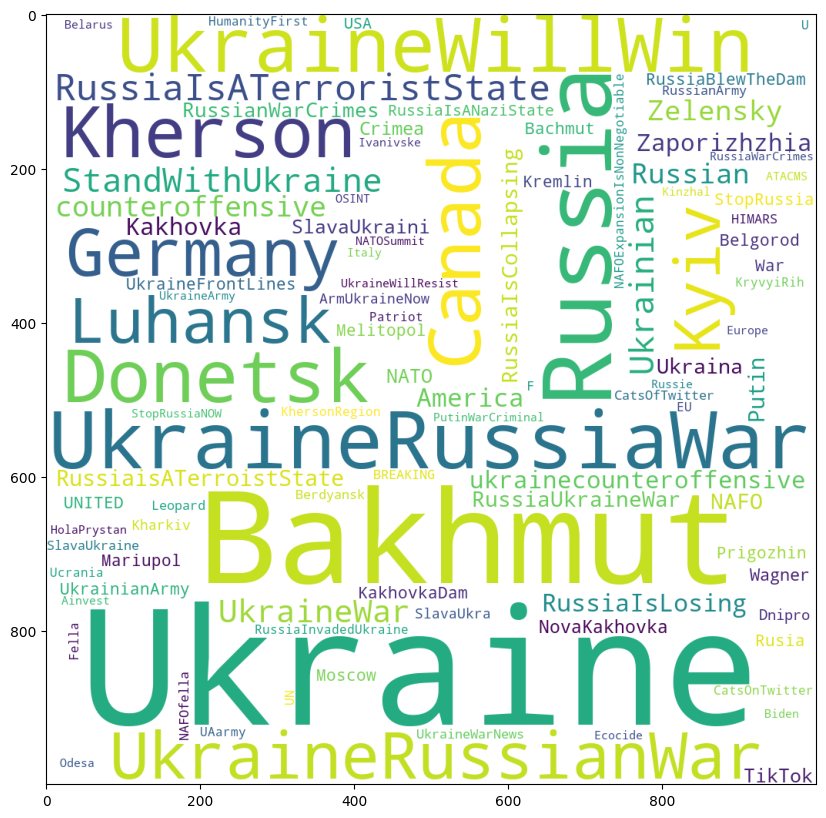

In [115]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
wordCloud = WordCloud(width = 1000, height = 1000,
                background_color ='white',
                max_words=100,
                      collocations=False,
                min_font_size = 10).generate(' '.join(df[df['pred_int']==2]['hashtags']))
plt.figure(figsize=(10,10))
plt.imshow(wordCloud)

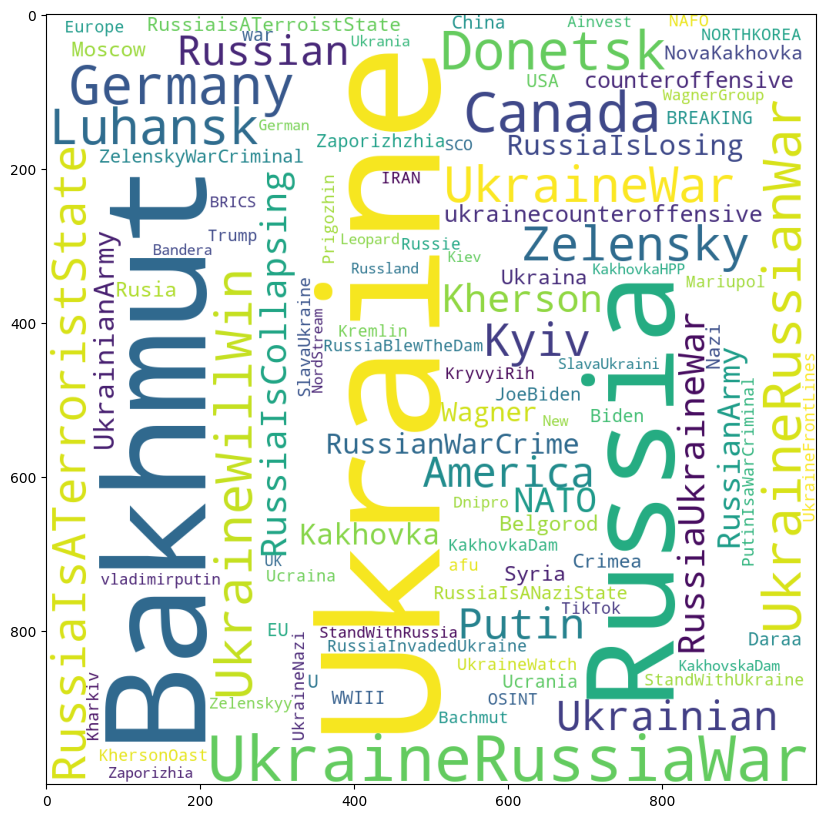

In [114]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
wordCloud = WordCloud(width = 1000, height = 1000,
                background_color ='white',
                max_words=100,
                      collocations=False,
                min_font_size = 10).generate(' '.join(df[df['pred_int']==0]['hashtags']))
plt.figure(figsize=(10,10))
plt.imshow(wordCloud)

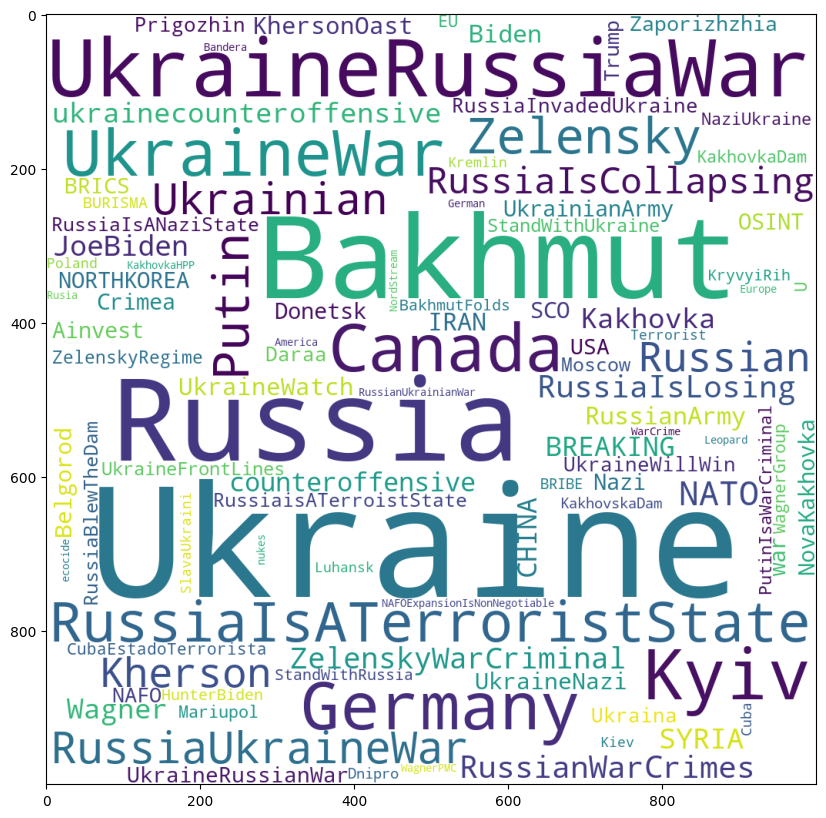

In [124]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
wordCloud = WordCloud(width = 1000, height = 1000,
                background_color ='white',
                max_words=100,
                      collocations=False,
                min_font_size = 14).generate(' '.join(df[(df['pred_int']==0)&(df['location']=='USA')]['hashtags']))
plt.figure(figsize=(10,10))
plt.imshow(wordCloud)

In [125]:
df

,location,text,month,clean_text,prediction,pred_int,continent,hashtags
0,Libya,Videos Appear to Show Ukrainian Troops Shootin...,2023-05,Videos Appear to Show Ukrainian Troops Shootin...,Negative,0,Africa,#UkraineRussianWar #UkraineWillWin #Luhansk #D...
1,USA,Today (apr 25 2023) Ukrainian forces use HIMAR...,2023-05,Today (apr 25 2023) Ukrainian forces use HIMAR...,Positive,2,America,#Canada #Germany #Bakhmut #Kyiv #Ukraine
2,USA,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2,America,#Bakhmut #UkraineWillWin #Ukraine #NAFO
3,Canada,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2,America,#Bakhmut #UkraineWillWin #Ukraine #NAFO
4,USA,Sergei is a hero.\n\nDuring a battle in #Bakhm...,2023-05,"Sergei is a hero.During a battle in #Bakhmut, ...",Positive,2,America,#Bakhmut #UkraineWillWin #Ukraine #NAFO
...,...,...,...,...,...,...,...,...
161024,USA,Don't just get mad. Get busy.\n1-Donate https:...,2023-06,Don't just get mad. Get busy.1-Donate 2-Shop ...,Positive,2,America,#Ukraine
161025,Germany,7 marines of the 38th brigade of the Armed For...,2023-06,7 marines of the 38th brigade of the Armed For...,Neutral,1,Europe,#Ukraine #Kherson
161026,USA,"In #France, the government has uncovered a maj...",2023-06,"In #France, the government has uncovered a maj...",Negative,0,America,#France #disinformation #Russia #Ukraine
161027,Italy,💔Last day of the school year in a Ukrainian vi...,2023-06,💔Last day of the school year in a Ukrainian vi...,Positive,2,Europe,#Ukraine #RussiaUkraineWar #RussiaIsATerrorist...


In [128]:
df.to_csv('sentimentDF.csv')

## Task